# Exploring Images


### PML Bodies Images

In [3]:
import cv2
import numpy as np
# Read the image
image_path_pml = '/Users/pallavisingh/Library/CloudStorage/OneDrive-SharedLibraries-DalhousieUniversity/Priyadharshini Sridharan - MLOps images/SAEC exp1 As High 63x - Position 1_Z00_C1.tif'
# image = cv2.imread(image_path_pml, cv2.IMREAD_UNCHANGED)

image_path_nuclei = '/Users/pallavisingh/Library/CloudStorage/OneDrive-SharedLibraries-DalhousieUniversity/Priyadharshini Sridharan - MLOps images/SAEC exp1 As High 63x - Position 1_Z00_C0.tif'
image_pml = cv2.imread(image_path_pml, cv2.IMREAD_UNCHANGED)
image_nuclei = cv2.imread(image_path_nuclei, cv2.IMREAD_UNCHANGED)

if image_pml is None or image_nuclei is None:
    print("Error: Could not load the image.")
    
# Get image properties for PML bodies
height, width = image_pml.shape[:2]
channels = 1 if len(image_pml.shape) == 2 else image_pml.shape[2]
dtype = image_pml.dtype

print(f"Image dimensions for PMl Bodies: {width}x{height}")
print(f"Number of channels for PMl Bodies: {channels}")
print(f"Data type for PMl Bodies: {dtype}")

# Get image properties for Nuclei
height_n, width_n = image_nuclei.shape[:2]
channels_n = 1 if len(image_nuclei.shape) == 2 else image_nuclei.shape[2]
dtype_n = image_nuclei.dtype

print(f"Image dimensions for Nuclei: {width_n}x{height_n}")
print(f"Number of channels for Nuclei: {channels_n}")
print(f"Data type for Nuclei: {dtype_n}")

Image dimensions for PMl Bodies: 512x512
Number of channels for PMl Bodies: 1
Data type for PMl Bodies: uint16
Image dimensions for Nuclei: 512x512
Number of channels for Nuclei: 1
Data type for Nuclei: uint16


In [127]:
print(f"Pixel value range for PMl: {np.min(image_pml)} to {np.max(image_pml)}")
print(f"Pixel value range for Nuclei: {np.min(image_nuclei)} to {np.max(image_nuclei)}")

Pixel value range for PMl: 443 to 35298
Pixel value range for Nuclei: 784 to 31962


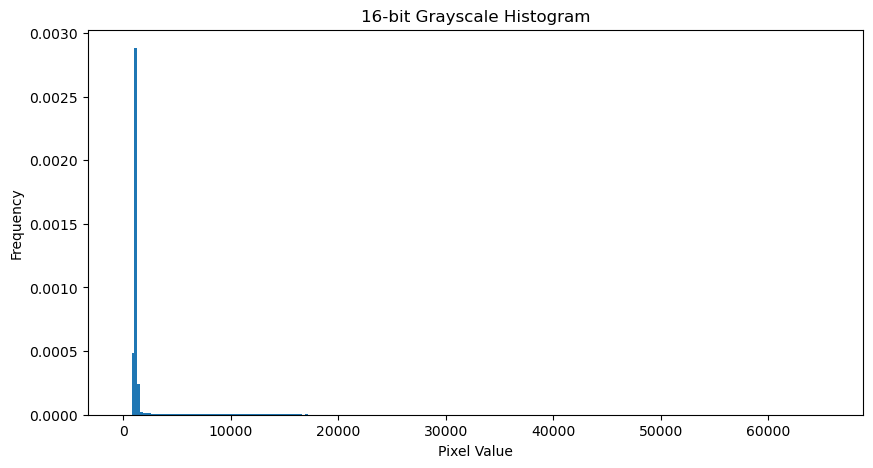

In [128]:
from matplotlib import pyplot as plt
plt.figure(figsize=(10, 5))
plt.hist(image_nuclei.ravel(), bins=256, range=(0, 65535), density=True)
plt.title('16-bit Grayscale Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

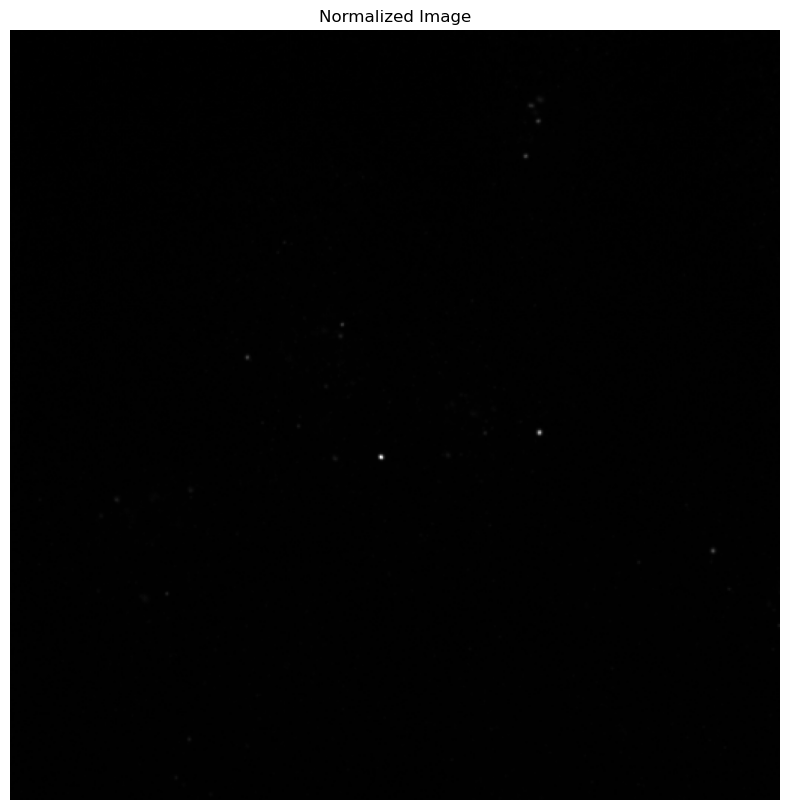

In [129]:
# Display the PML Bodies image
# Normalize to 0-255 for display
image_normalized = cv2.normalize(image_pml, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
plt.figure(figsize=(10, 10))
plt.imshow(image_normalized, cmap='gray')
plt.title('Normalized Image')
plt.axis('off')
plt.show()

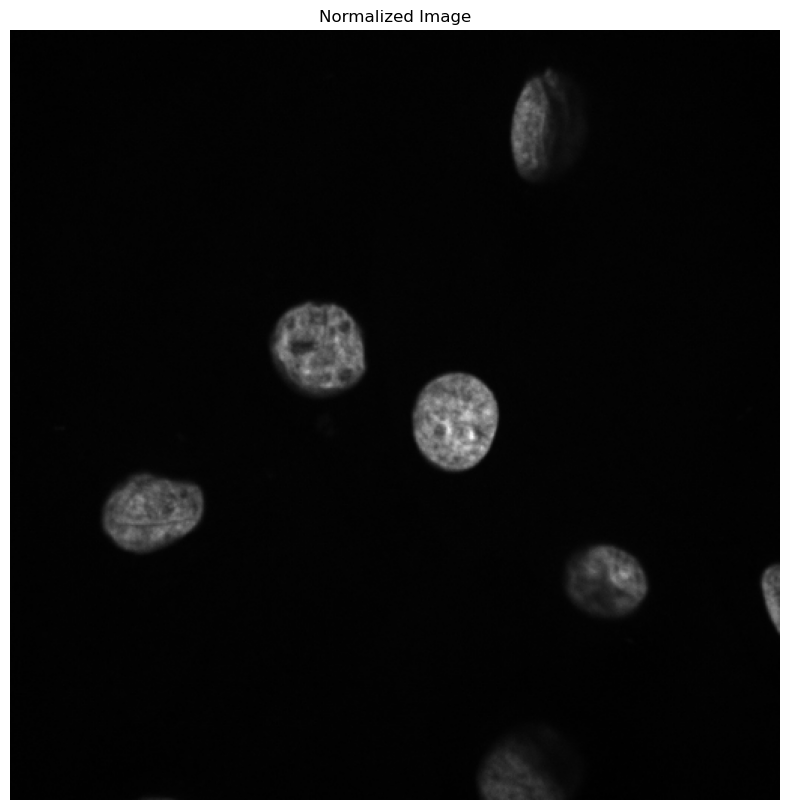

In [130]:
# Display the Nuclei image
# Normalize to 0-255 for display
image_normalized = cv2.normalize(image_nuclei, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
plt.figure(figsize=(10, 10))
plt.imshow(image_normalized, cmap='gray')
plt.title('Normalized Image')
plt.axis('off')
plt.show()

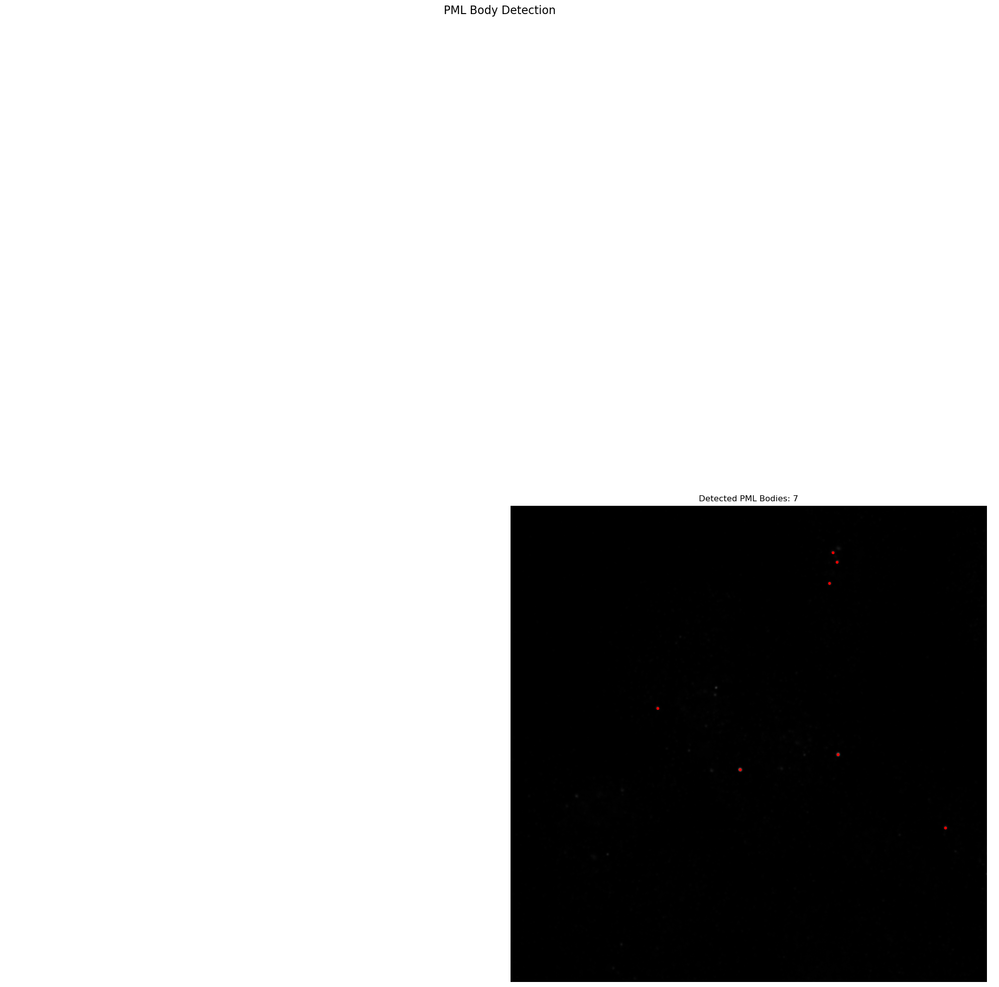

Number of potential PML bodies detected: 7


NameError: name 'output_path' is not defined

In [165]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, measure
from scipy import ndimage

def detect_pml_bodies(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    
    if image is None:
        print("Error: Could not load the image.")
        return

    # Apply Gaussian blur to reduce noise
    image_smoothed = filters.gaussian(image, sigma=2)

    # Adaptive thresholding
    thresh = filters.threshold_otsu(image_smoothed)
    binary = image_smoothed > thresh

    # Remove small objects (noise)
    binary_cleaned = ndimage.binary_opening(binary, structure=np.ones((3,3)))

    # Label connected components
    labeled_image, num_features = ndimage.label(binary_cleaned)

    # Measure properties of labeled image regions
    regions = measure.regionprops(labeled_image, image)

    # Filter regions based on area and intensity
    min_area = 5  # Adjust based on expected size of PML bodies
    min_intensity = np.percentile(image, 95)  # Adjust based on expected intensity of PML bodies
    pml_bodies = [region for region in regions if region.area >= min_area and region.max_intensity >= min_intensity]

    # Visualization
    fig, axs = plt.subplots(2, 2, figsize=(20, 20))
    fig.suptitle('PML Body Detection', fontsize=16)

#     # Original image
#     axs[0, 0].imshow(image, cmap='gray')
#     axs[0, 0].set_title('Original Image')

#     # Smoothed image
#     axs[0, 1].imshow(image_smoothed, cmap='gray')
#     axs[0, 1].set_title('Smoothed Image')

#     # Binary image after cleaning
#     axs[1, 0].imshow(binary_cleaned, cmap='gray')
#     axs[1, 0].set_title('Binary Image (Cleaned)')

    # Original image with detected PML bodies
    axs[1, 1].imshow(image, cmap='gray')
    for region in pml_bodies:
        y, x = region.centroid
        axs[1, 1].plot(x, y, 'r.')
    axs[1, 1].set_title(f'Detected PML Bodies: {len(pml_bodies)}')

    # Remove axis ticks
    for ax in axs.flat:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Number of potential PML bodies detected: {len(pml_bodies)}")
    
    # Save the final image with detected PML bodies if output path is provided
    if output_path:
        output_image = np.copy(image)
        for region in pml_bodies:
            y, x = region.centroid
            cv2.circle(output_image, (int(x), int(y)), 10, (255, 0, 0), 2)  # Draw red circle at PML body centroid
        cv2.imwrite(output_path, output_image)
        print(f"Saved processed image to {output_path}")


detect_pml_bodies(image_path_pml)

In [132]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, measure, io
from scipy import ndimage
import cv2

def detect_and_highlight_pml_bodies(image_path):
    
    # Read the image in grayscale (assuming it is in 8-bit grayscale)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  
    
    if image is None:
        print("Error: Could not load the image.")
        return
    
    # Apply Gaussian blur to reduce noise
    image_smoothed = filters.gaussian(image, sigma=2)
    
    # Scale the thresholds from the given range (722, 28812) to match the 8-bit scale (0-255)
    scaled_min = np.interp(722, (0, 65535), (0, 255))   # Assuming original was 16-bit
    scaled_max = np.interp(28812, (0, 65535), (0, 255)) # Assuming original was 16-bit
    
    # Apply thresholding with the scaled values
    binary = (image_smoothed >= scaled_min) & (image_smoothed <= scaled_max)
    
    # Remove small objects (noise)
    binary_cleaned = ndimage.binary_opening(binary, structure=np.ones((3,3)))
    
    # Label connected components
    labeled_image, num_features = ndimage.label(binary_cleaned)
    
    # Measure properties of labeled image regions
    regions = measure.regionprops(labeled_image, image_smoothed)
    
    # Filter regions based on area
    min_area = 5  # Adjust based on expected size of PML bodies
    pml_bodies = [region for region in regions if region.area >= min_area]
    
    # Create an empty RGB image for color overlay
    blue_highlight = np.stack([image_smoothed]*3, axis=-1)  # Convert grayscale to RGB by stacking channels
    
    # Create a blue mask for binary areas
    blue_mask = np.zeros_like(blue_highlight)
    blue_mask[binary_cleaned] = [0, 0, 255]  # Blue


detect_and_highlight_pml_bodies()

In [133]:
import numpy as np

# Define a threshold for "non-black" areas
threshold = 900  # You can adjust this value

# Count pixels above the threshold
non_black_pixels = np.sum(image_nuclei > threshold)
total_pixels = image_nuclei.size

# Percentage of non-black pixels
percentage_non_black = (non_black_pixels / total_pixels) * 100
print(f"Percentage of non-black pixels: {percentage_non_black:.2f}%")


Percentage of non-black pixels: 99.56%


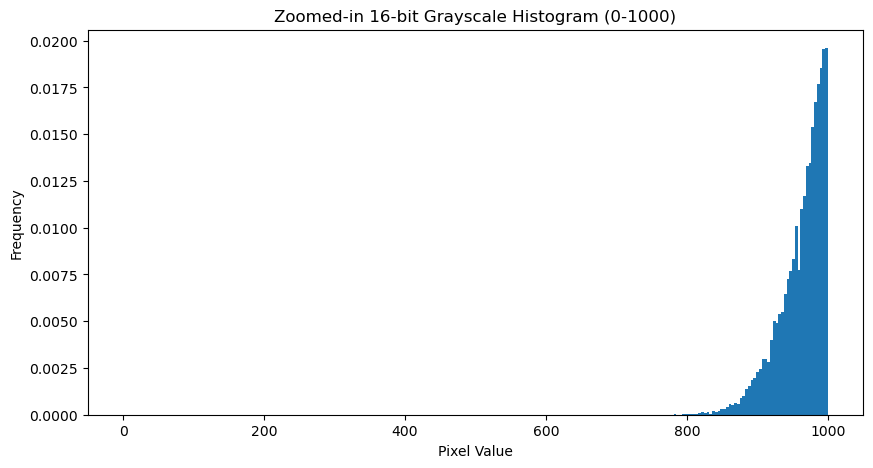

In [134]:
plt.figure(figsize=(10, 5))
plt.hist(image_nuclei.ravel(), bins=256, range=(0, 1000), density=True)
plt.title('Zoomed-in 16-bit Grayscale Histogram (0-1000)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()


In [135]:
percentiles = np.percentile(image_nuclei, [5, 50, 95])
print(f"5th percentile: {percentiles[0]}")
print(f"50th percentile (median): {percentiles[1]}")
print(f"95th percentile: {percentiles[2]}")


5th percentile: 980.0
50th percentile (median): 1138.0
95th percentile: 4660.699999999953


In [136]:
dark_region_pixels = np.sum(image_nuclei < 917)
bright_region_pixels = np.sum(image_nuclei > 3384)

# Calculate percentage of dark and bright pixels
percentage_dark = (dark_region_pixels / total_pixels) * 100
percentage_bright = (bright_region_pixels / total_pixels) * 100

print(f"Percentage of dark pixels (below 917): {percentage_dark:.2f}%")
print(f"Percentage of bright pixels (above 3384): {percentage_bright:.2f}%")


Percentage of dark pixels (below 917): 0.80%
Percentage of bright pixels (above 3384): 5.61%


In [150]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, measure
from scipy import ndimage
import cv2

def detect_and_highlight_nuclei(image_path,output_path):
    
    # Read the image in 16-bit format
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)  # Read as 16-bit (uint16)
    
    if image is None:
        print("Error: Could not load the image.")
        return
    
    print(f"Image shape: {image.shape}, dtype: {image.dtype}, max pixel value: {image.max()}")
    
    # Normalize the image only for display purposes (0 to 255 range)
    image_normalized = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    # Preprocessing: Contrast enhancement using CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    image_clahe = clahe.apply(image_normalized)
    
    # Preprocessing: Noise reduction using bilateral filtering
    image_smoothed = cv2.bilateralFilter(image_clahe, d=9, sigmaColor=75, sigmaSpace=75)
    
    # Plot the histogram of pixel intensities to understand the distribution
#     plt.figure(figsize=(8, 6))
#     plt.hist(image.ravel(), bins=100, range=[0, image.max()])
#     plt.title("Histogram of Pixel Intensities")
#     plt.xlabel("Pixel Intensity")
#     plt.ylabel("Frequency")
#     plt.show()

    # Compute percentiles to find a better custom threshold
    lower_percentile = np.percentile(image, 5)  # Adjust based on analysis
    upper_percentile = np.percentile(image, 95)
    
    print(f"5th percentile: {lower_percentile}, 95th percentile: {upper_percentile}")
    
#     # Otsu's Thresholding
#     otsu_threshold = filters.threshold_otsu(image_smoothed)
#     print(f"Otsu's threshold (0-1 range for smoothed image): {otsu_threshold}")
    
    # Custom Thresholding based on Percentile (Adaptive Threshold)
    p_low, p_high = 91, 99  # Percentile range
    low_threshold = np.percentile(image_smoothed, p_low)
    high_threshold = np.percentile(image_smoothed, p_high)
    print(f"Adaptive threshold range: {low_threshold} - {high_threshold}")
    
    # Binary Thresholding
#     binary_otsu = image_smoothed >= otsu_threshold
    binary_custom = (image_smoothed >= low_threshold) & (image_smoothed <= high_threshold)
    
    # Clean up the binary images using binary opening (removes small objects)
#     binary_cleaned_otsu = ndimage.binary_opening(binary_otsu, structure=np.ones((3,3)))
    binary_cleaned_custom = ndimage.binary_opening(binary_custom, structure=np.ones((3,3)))
    
    # Label connected components
#     labeled_image_otsu, num_features_otsu = ndimage.label(binary_cleaned_otsu)
    labeled_image_custom, num_features_custom = ndimage.label(binary_cleaned_custom)
    
    # Measure properties of labeled image regions for both methods
#     regions_otsu = measure.regionprops(labeled_image_otsu, image_smoothed)
    regions_custom = measure.regionprops(labeled_image_custom, image_smoothed)
    
    # Filter regions based on area (adjust the min_area as needed)
    min_area = 200  # Adjust this value based on region size in your image
#     nuclei_otsu = [region for region in regions_otsu if region.area >= min_area]
    nuclei_custom = [region for region in regions_custom if region.area >= min_area]
    
#     print(f"Number of nuclei detected (Otsu): {len(nuclei_otsu)}")
    print(f"Number of nuclei detected (Custom threshold): {len(nuclei_custom)}")
    
    # Create empty 3-channel images (for displaying blue overlay)
#     blue_highlighted_image_otsu = cv2.cvtColor(image_normalized, cv2.COLOR_GRAY2BGR)  # Otsu
    blue_highlighted_image_custom = cv2.cvtColor(image_normalized, cv2.COLOR_GRAY2BGR)  # Custom
    
    # Set the blue color (BGR format in OpenCV)
    blue_color = (0, 255, 255)  # Cyan
    
    # Apply blue color to detected nuclei regions for both methods
#     for nucleus in nuclei_otsu:
#         coords = nucleus.coords
#         for coord in coords:
#             blue_highlighted_image_otsu[coord[0], coord[1]] = blue_color
    
    for nucleus in nuclei_custom:
        coords = nucleus.coords
        for coord in coords:
            blue_highlighted_image_custom[coord[0], coord[1]] = blue_color
            
    # Save the result to the output path
    cv2.imwrite(output_path, blue_highlighted_image_custom)
    print(f"Saved processed image to {output_path}")
    
#     # Visualization
#     fig, axs = plt.subplots(1, 4, figsize=(24, 6))
#     fig.suptitle('Nuclei Detection - Otsu vs Custom Threshold with CLAHE + Bilateral Filter', fontsize=16)
    
#     # Original image
#     axs[0].imshow(image_normalized, cmap='gray')
#     axs[0].set_title('Original Image')
    
# #     # Otsu method highlighted image
# #     axs[1].imshow(blue_highlighted_image_otsu)
# #     axs[1].set_title(f'Otsu Detection (Regions: {len(nuclei_otsu)})')
    
#     # Custom threshold highlighted image
#     axs[1].imshow(blue_highlighted_image_custom)
#     axs[1].set_title(f'Custom Threshold Detection (Regions: {len(nuclei_custom)})')
    
# #     # Image after CLAHE and bilateral filter
# #     axs[3].imshow(image_smoothed, cmap='gray')
# #     axs[3].set_title('CLAHE + Bilateral Filter')
    
#     # Remove axis ticks
#     for ax in axs.flat:
#         ax.axis('off')
    
#     plt.tight_layout()
#     # Save the figure
#     plt.savefig(output_path, dpi=300, bbox_inches='tight'
#     plt.show()


In [152]:
def process_images_in_folder(input_folder, output_folder):
    
    
    # Loop through all files in the input folder
    for filename in os.listdir(input_folder):
        file_path = os.path.join(input_folder, filename)
        
        # Check if the file is an image (you can add more extensions if needed)
        if filename.lower().endswith(('.tif', '.tiff', '.png', '.jpg', '.jpeg')):
            output_filename = f"processed_{filename}"
            output_path = os.path.join(output_folder, output_filename)
            
            # Run the nuclei detection function on the image and save the result
            detect_and_highlight_nuclei(file_path, output_path)
            print(f"Saved processed image to {output_path}")
         
  

In [153]:
# Define the input folder path (where your images are located)
input_folder = '/Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Nucleus'  # Replace with the actual path to your input folder

# Define the output folder path (where you want the processed images to be saved)
output_folder = '/Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output'  # Replace with the actual path to your output folder

# Call the function to process all images in the folder
process_images_in_folder(input_folder, output_folder)


Image shape: (512, 512), dtype: uint16, max pixel value: 28521
5th percentile: 1065.0, 95th percentile: 3216.0
Adaptive threshold range: 14.0 - 133.0
Number of nuclei detected (Custom threshold): 7
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z27_C0.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z27_C0.tif
Image shape: (512, 512), dtype: uint16, max pixel value: 14507
5th percentile: 1060.0, 95th percentile: 2093.0
Adaptive threshold range: 28.0 - 113.0
Number of nuclei detected (Custom threshold): 7
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z35_C0.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniv

Number of nuclei detected (Custom threshold): 7
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z31_C0.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z31_C0.tif
Image shape: (512, 512), dtype: uint16, max pixel value: 32472
5th percentile: 1070.0, 95th percentile: 5214.0
Adaptive threshold range: 12.0 - 135.0
Number of nuclei detected (Custom threshold): 8
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z23_C0.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z23_C0.tif
Image shape: (512, 512), dtype: uint16, max pixel value: 28812
5th

Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z30_C0.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z30_C0.tif
Image shape: (512, 512), dtype: uint16, max pixel value: 30947
5th percentile: 1072.0, 95th percentile: 5938.699999999953
Adaptive threshold range: 12.0 - 143.0
Number of nuclei detected (Custom threshold): 8
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z22_C0.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z22_C0.tif
Image shape: (512, 512), dtype: uint16, max pixel value: 33825
5th percentile: 1072.0, 95th percentile:

In [156]:
def process_images_in_folder_pml(input_folder, output_folder):
    
    
    # Loop through all files in the input folder
    for filename in os.listdir(input_folder):
        file_path = os.path.join(input_folder, filename)
        
        # Check if the file is an image (you can add more extensions if needed)
        if filename.lower().endswith(('.tif', '.tiff', '.png', '.jpg', '.jpeg')):
            output_filename = f"processed_{filename}"
            output_path = os.path.join(output_folder, output_filename)
            
            # Run the nuclei detection function on the image and save the result
            detect_pml_bodies(file_path, output_path)
            # detect_and_highlight_nuclei(file_path, output_path)
            print(f"Saved processed image to {output_path}")

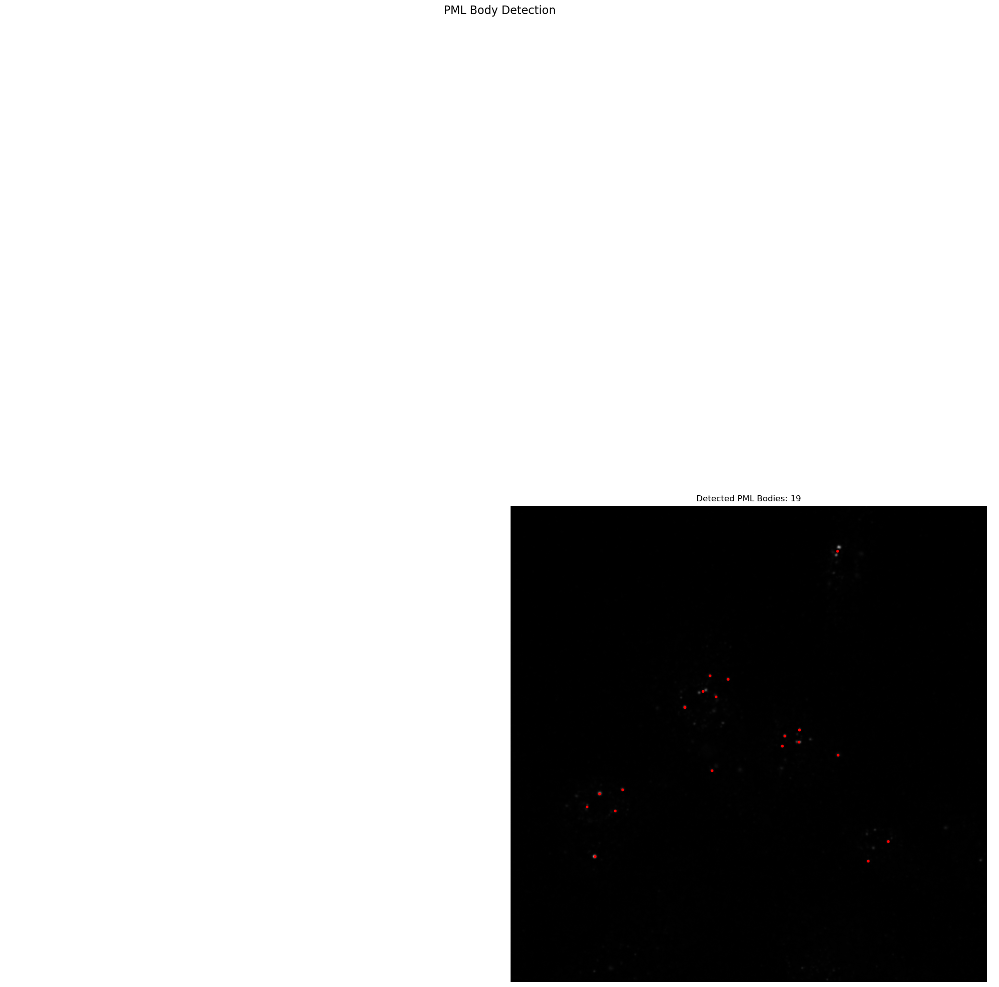

Number of potential PML bodies detected: 19
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z11_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z11_C1.tif


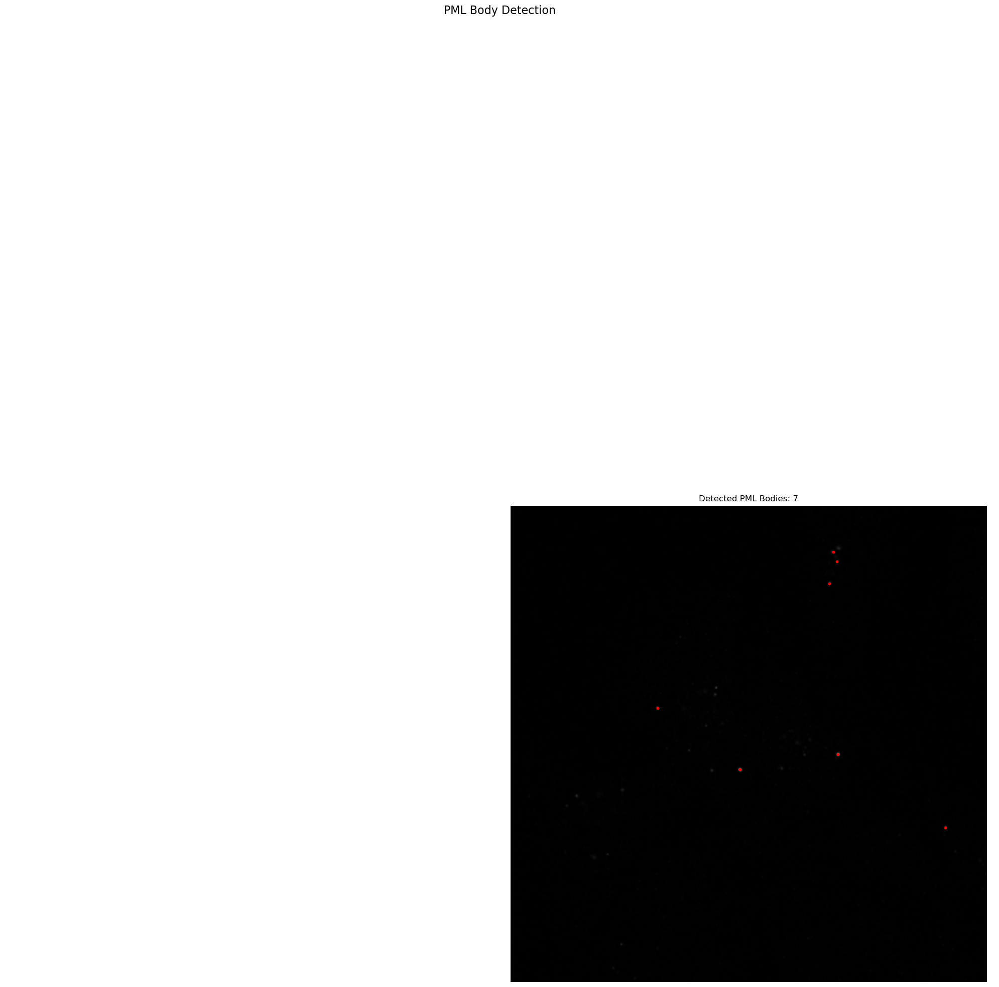

Number of potential PML bodies detected: 7
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z03_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z03_C1.tif


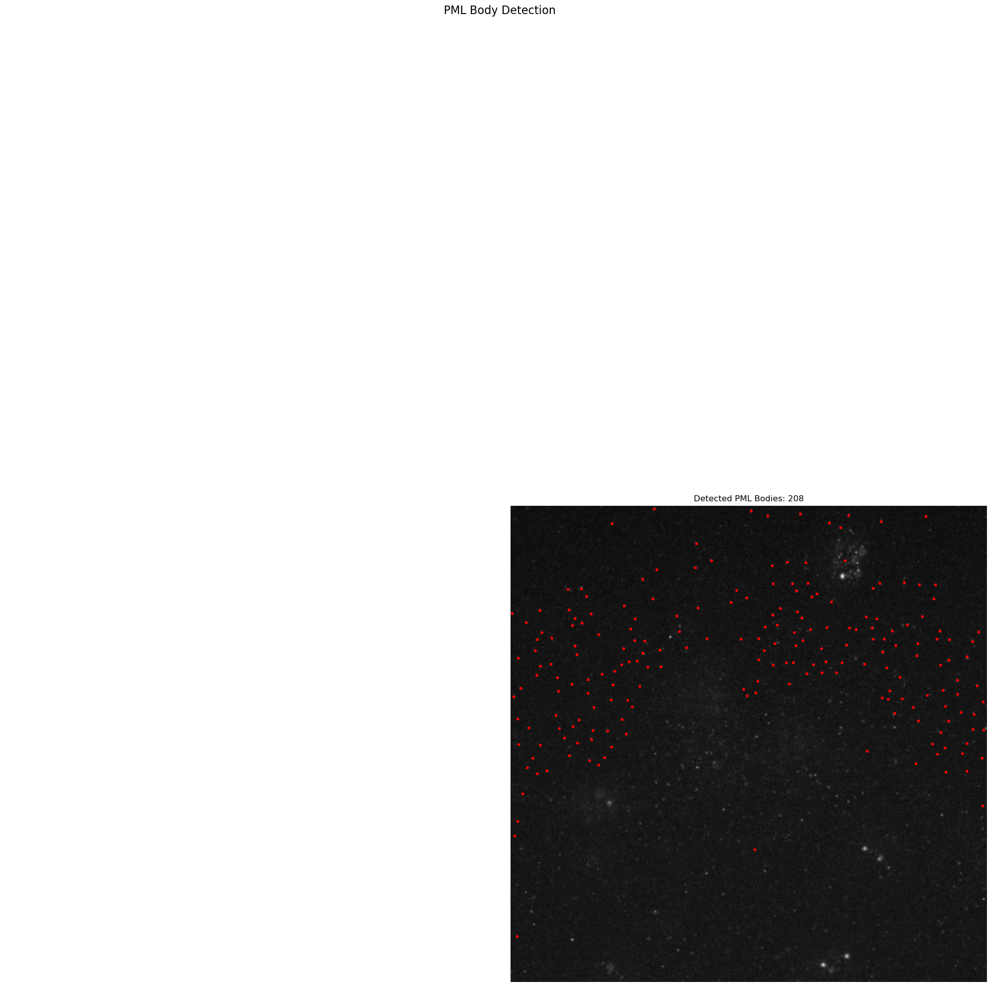

Number of potential PML bodies detected: 208
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z35_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z35_C1.tif


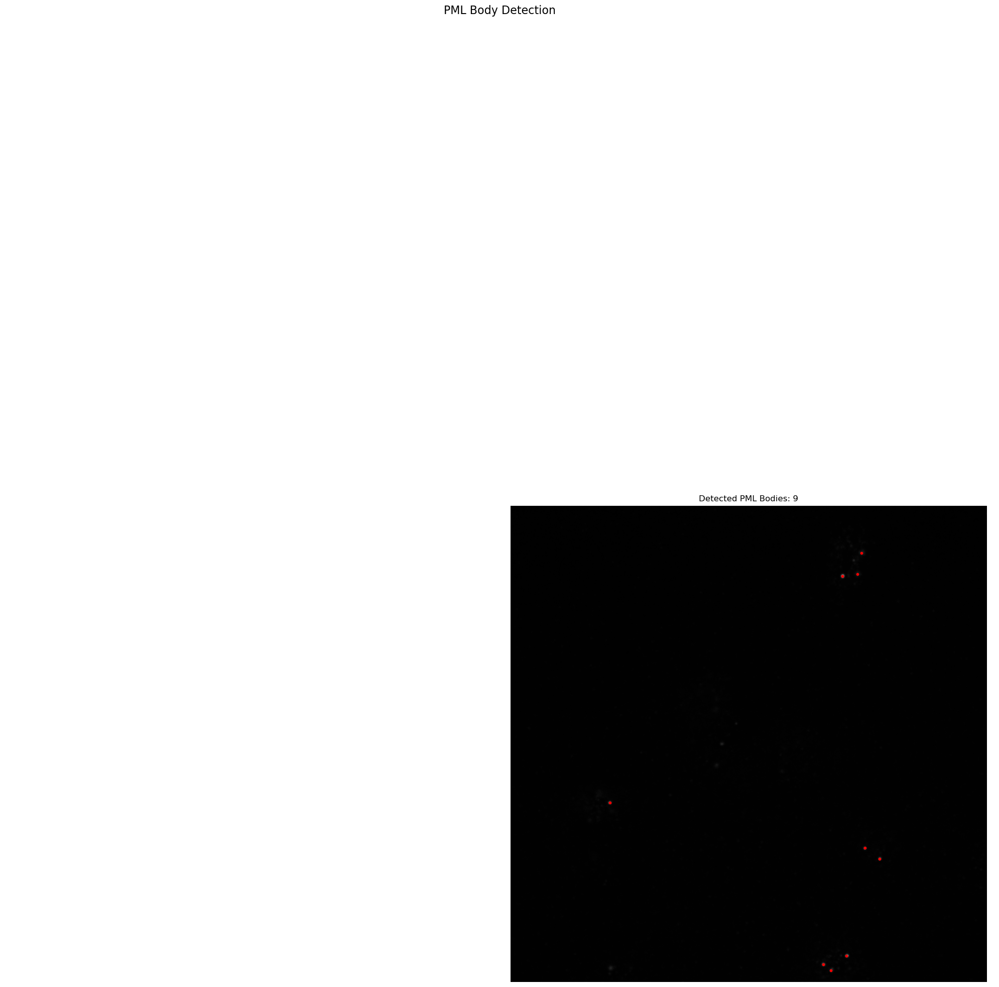

Number of potential PML bodies detected: 9
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z27_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z27_C1.tif


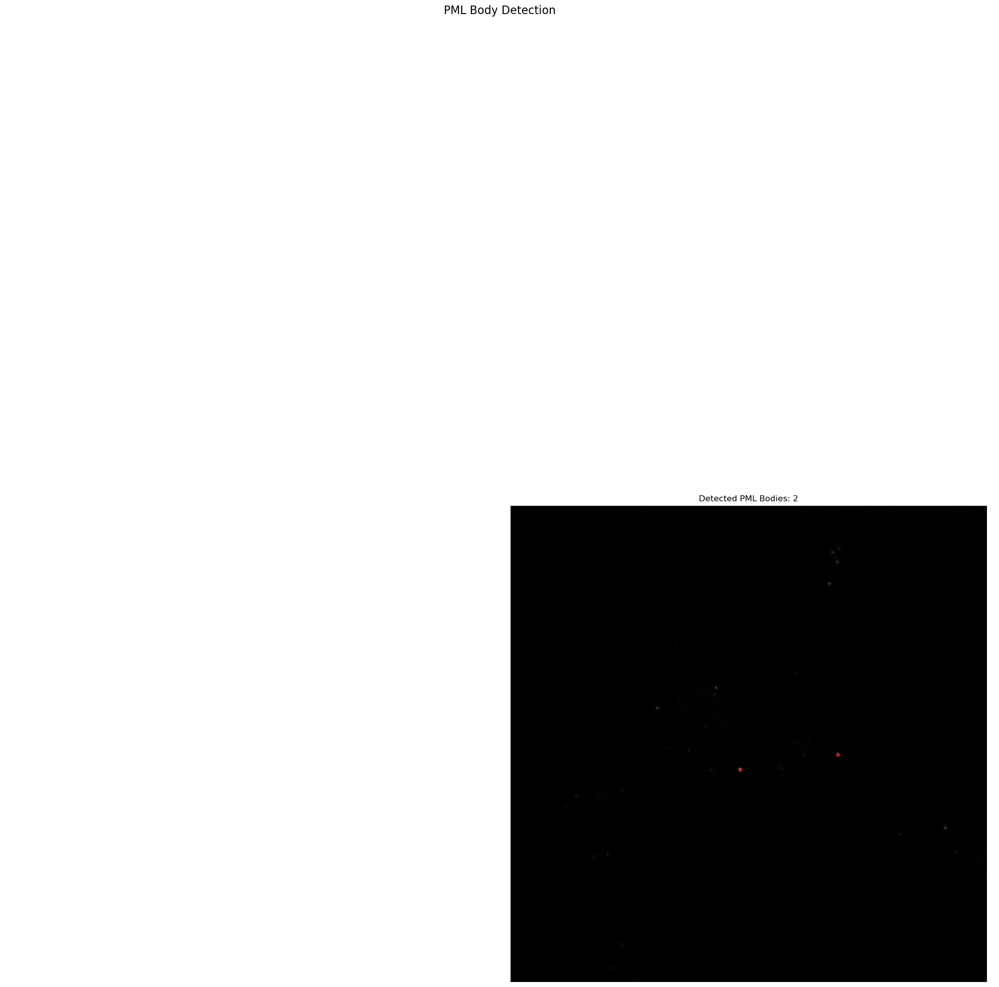

Number of potential PML bodies detected: 2
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z01_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z01_C1.tif


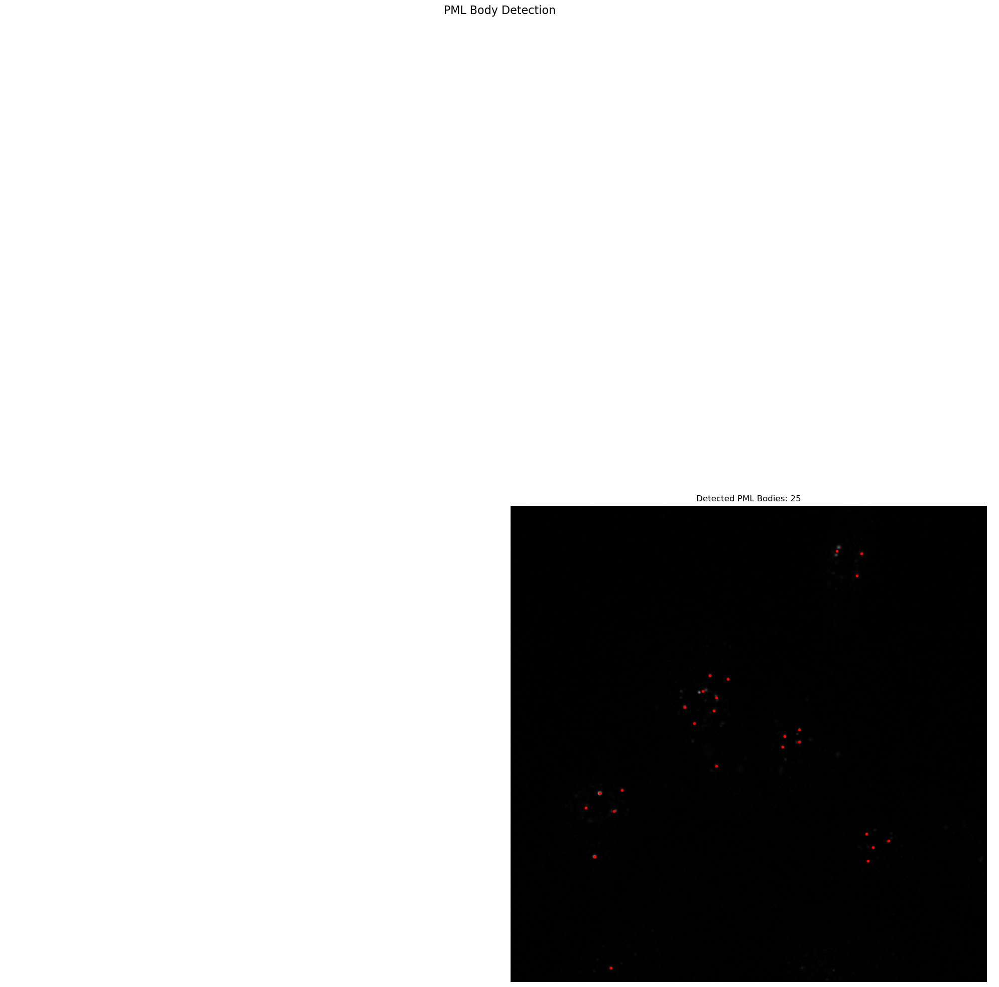

Number of potential PML bodies detected: 25
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z13_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z13_C1.tif


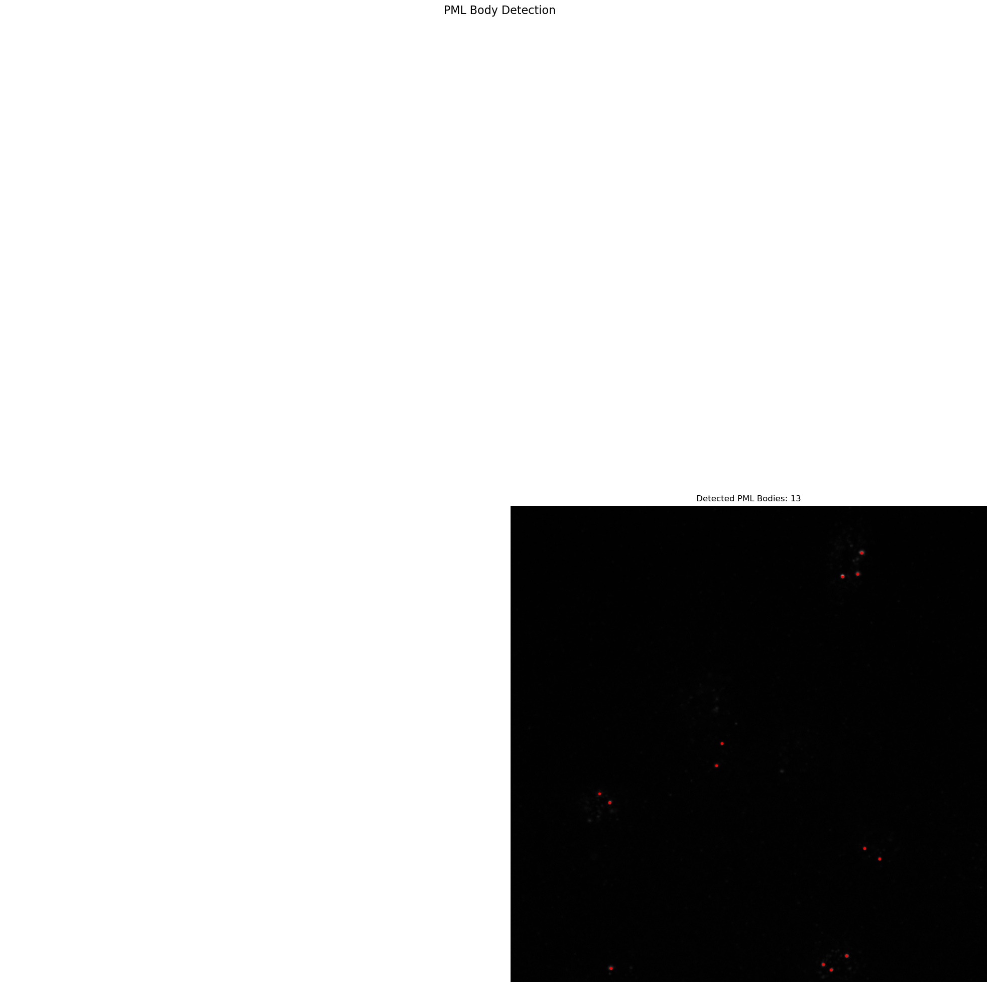

Number of potential PML bodies detected: 13
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z25_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z25_C1.tif


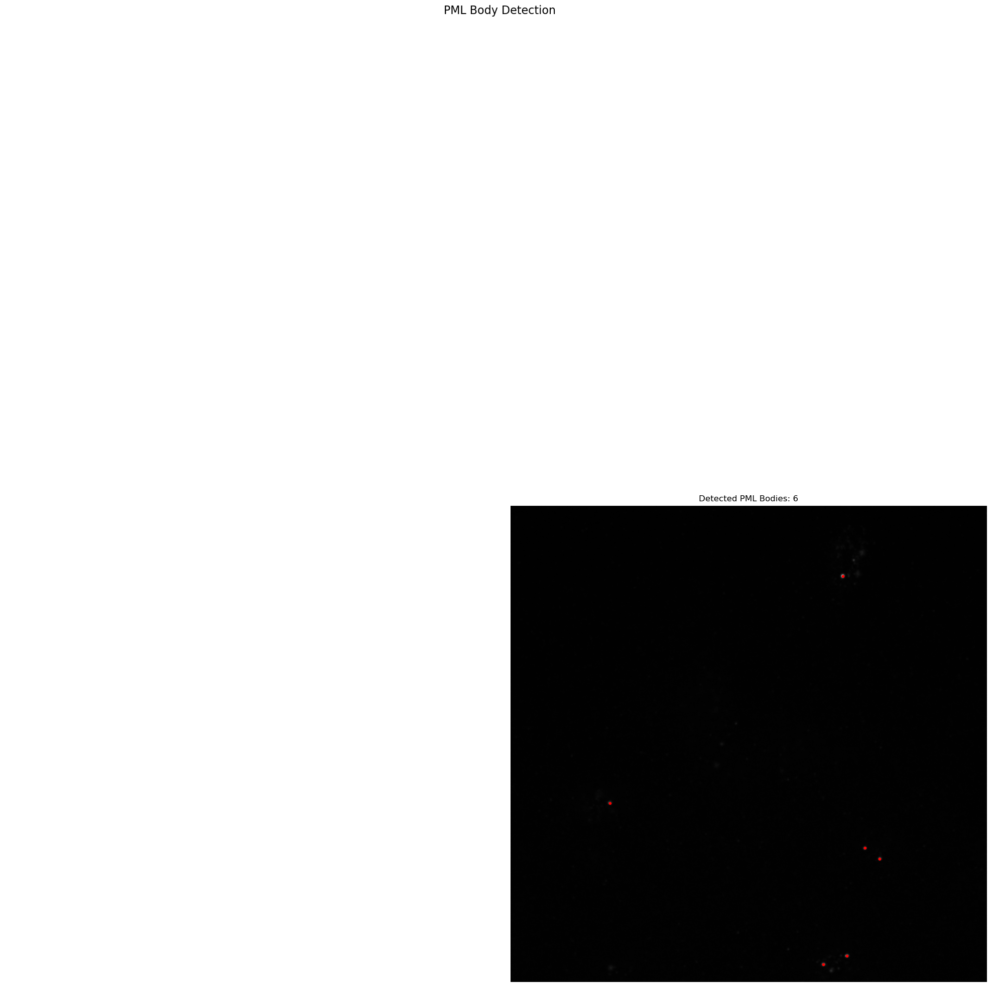

Number of potential PML bodies detected: 6
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z29_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z29_C1.tif


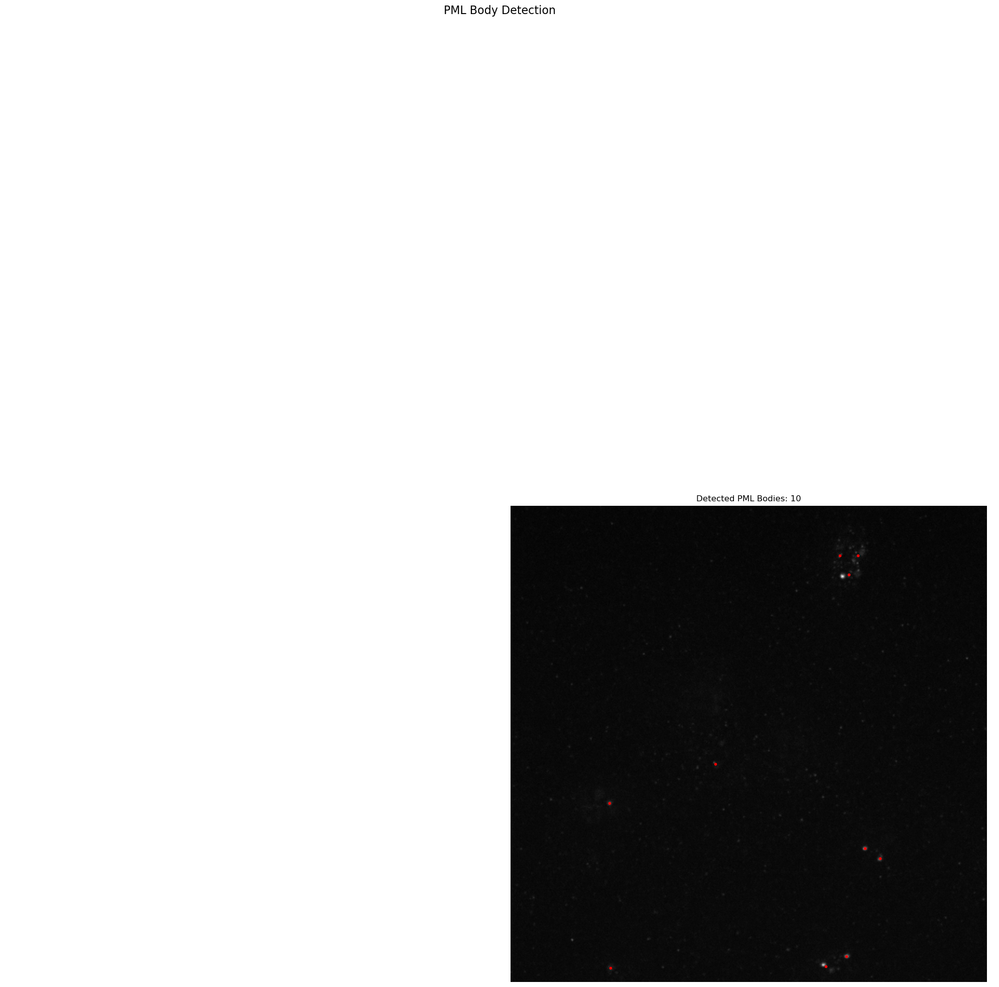

Number of potential PML bodies detected: 10
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z33_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z33_C1.tif


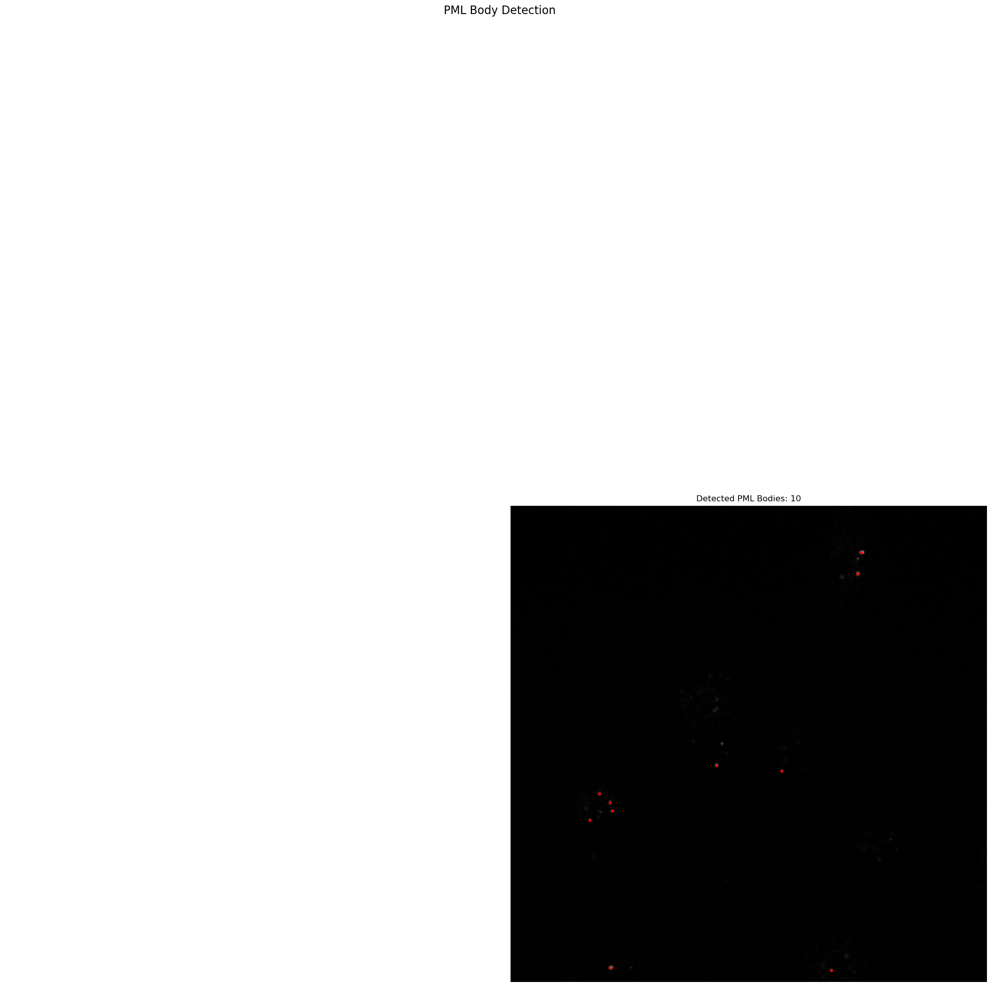

Number of potential PML bodies detected: 10
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z21_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z21_C1.tif


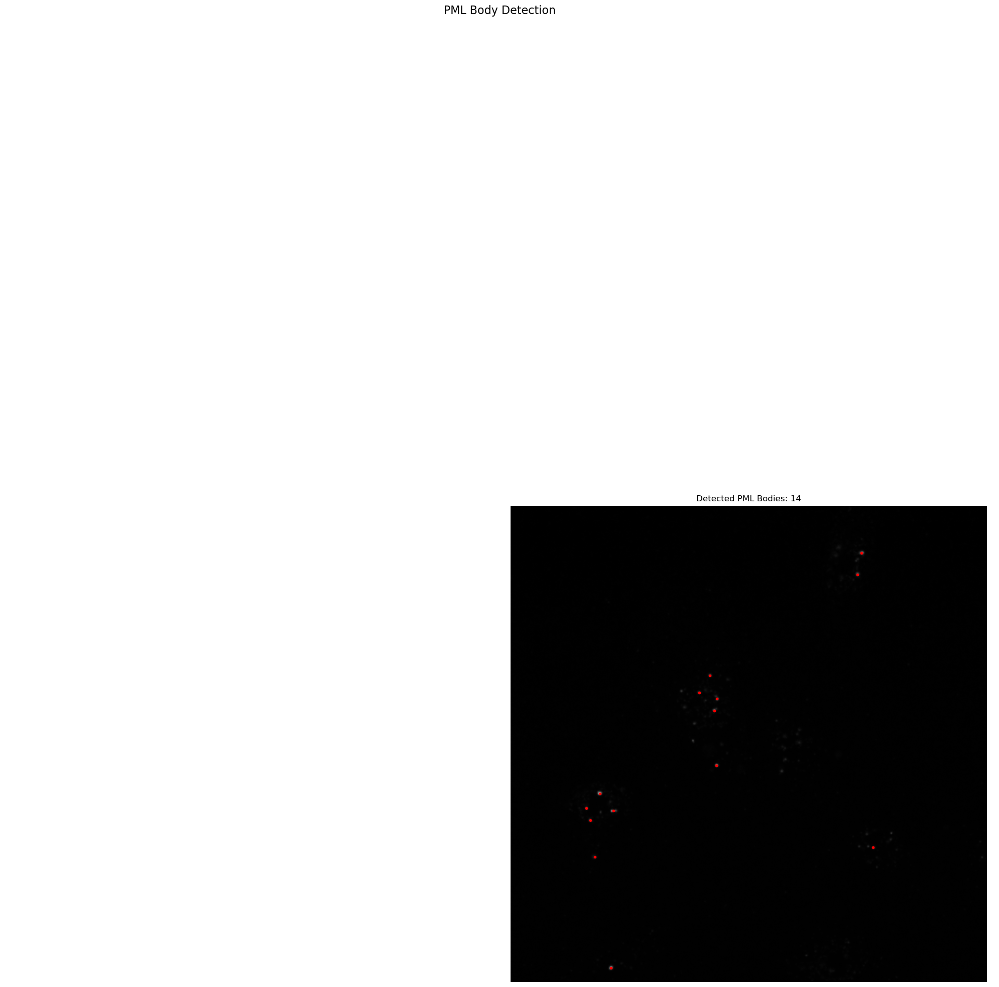

Number of potential PML bodies detected: 14
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z17_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z17_C1.tif


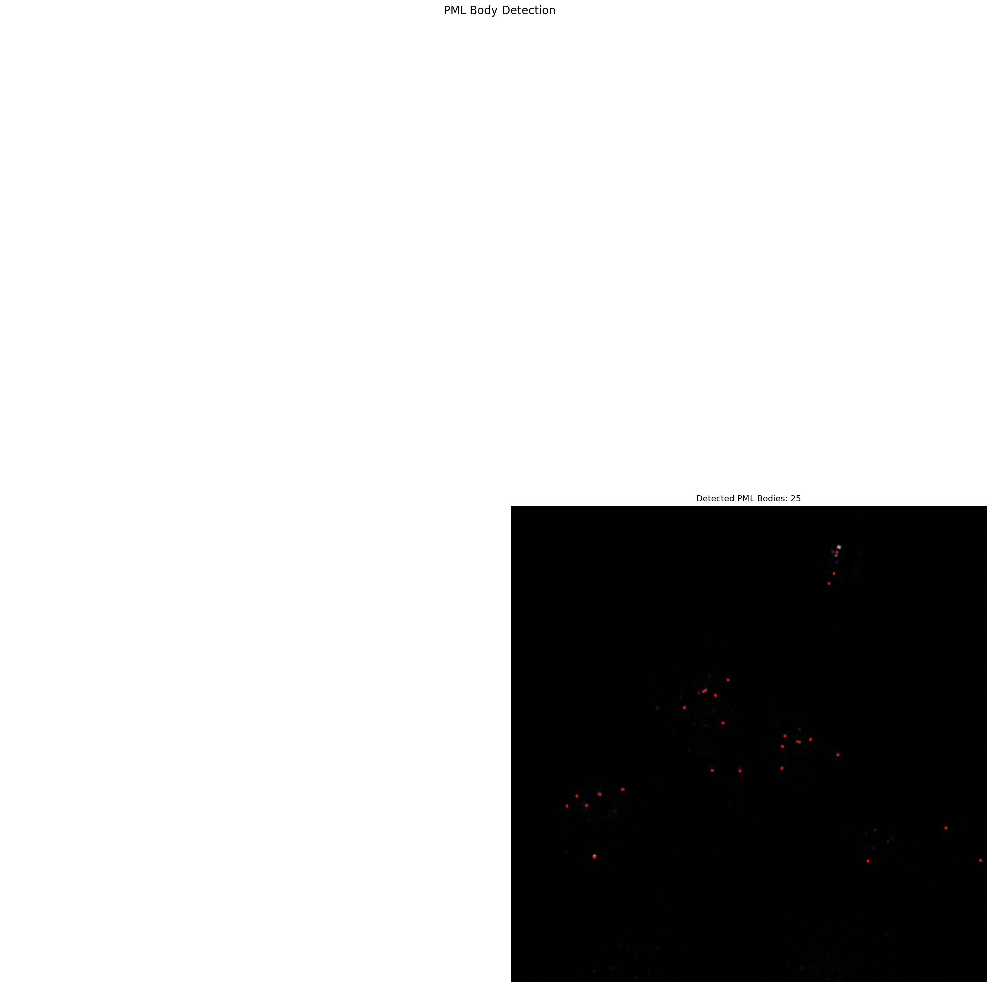

Number of potential PML bodies detected: 25
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z09_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z09_C1.tif


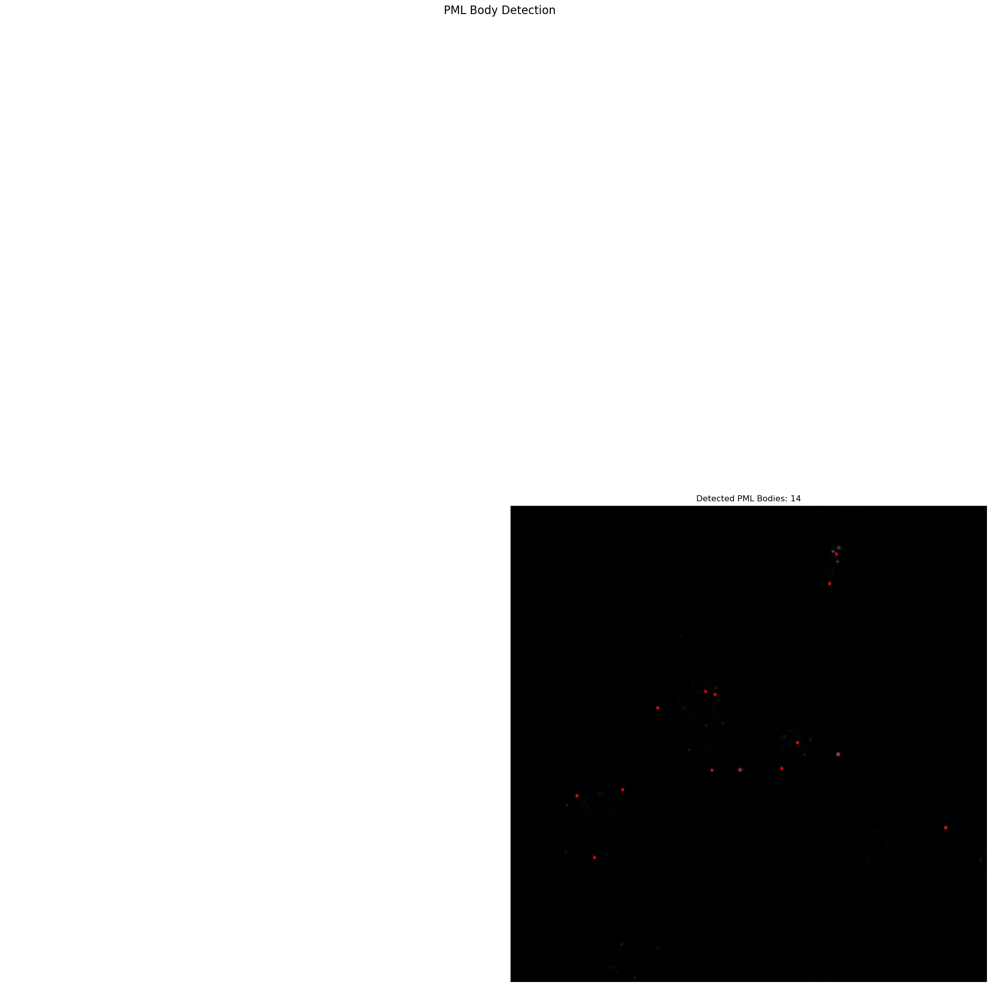

Number of potential PML bodies detected: 14
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z05_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z05_C1.tif


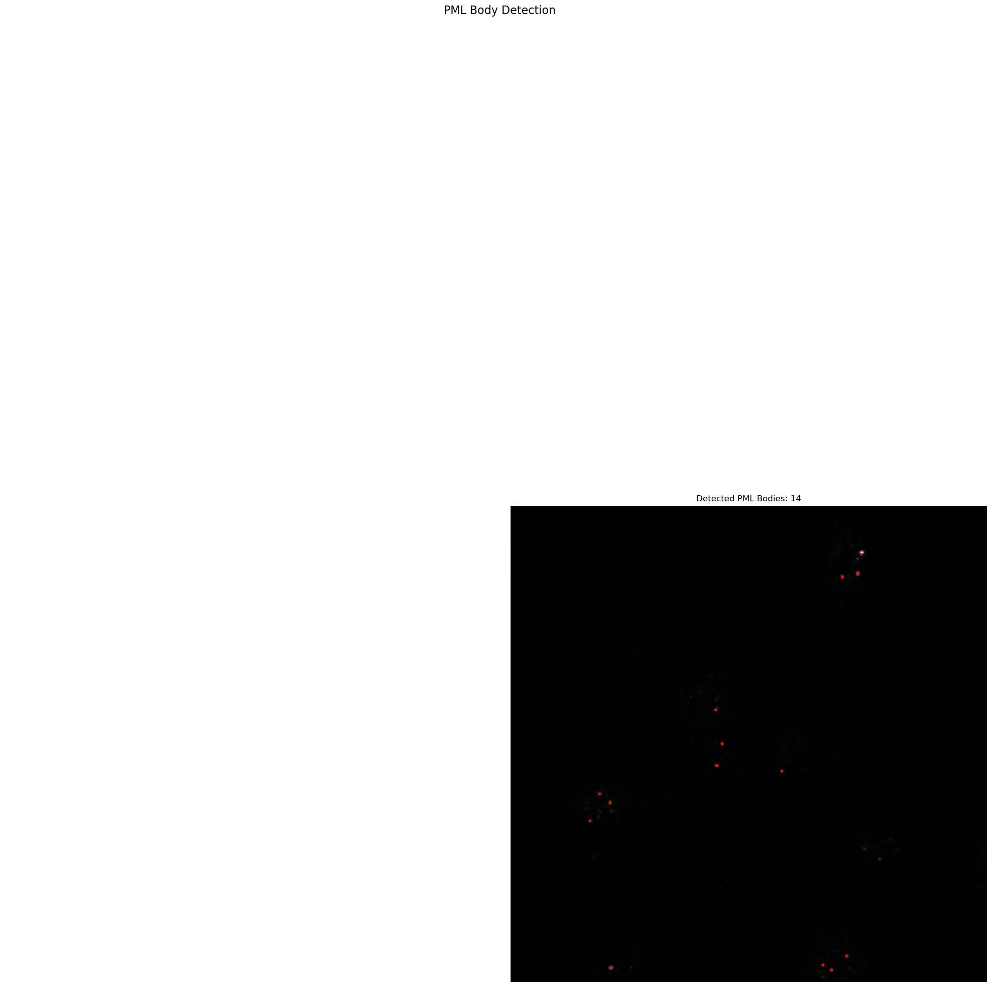

Number of potential PML bodies detected: 14
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z23_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z23_C1.tif


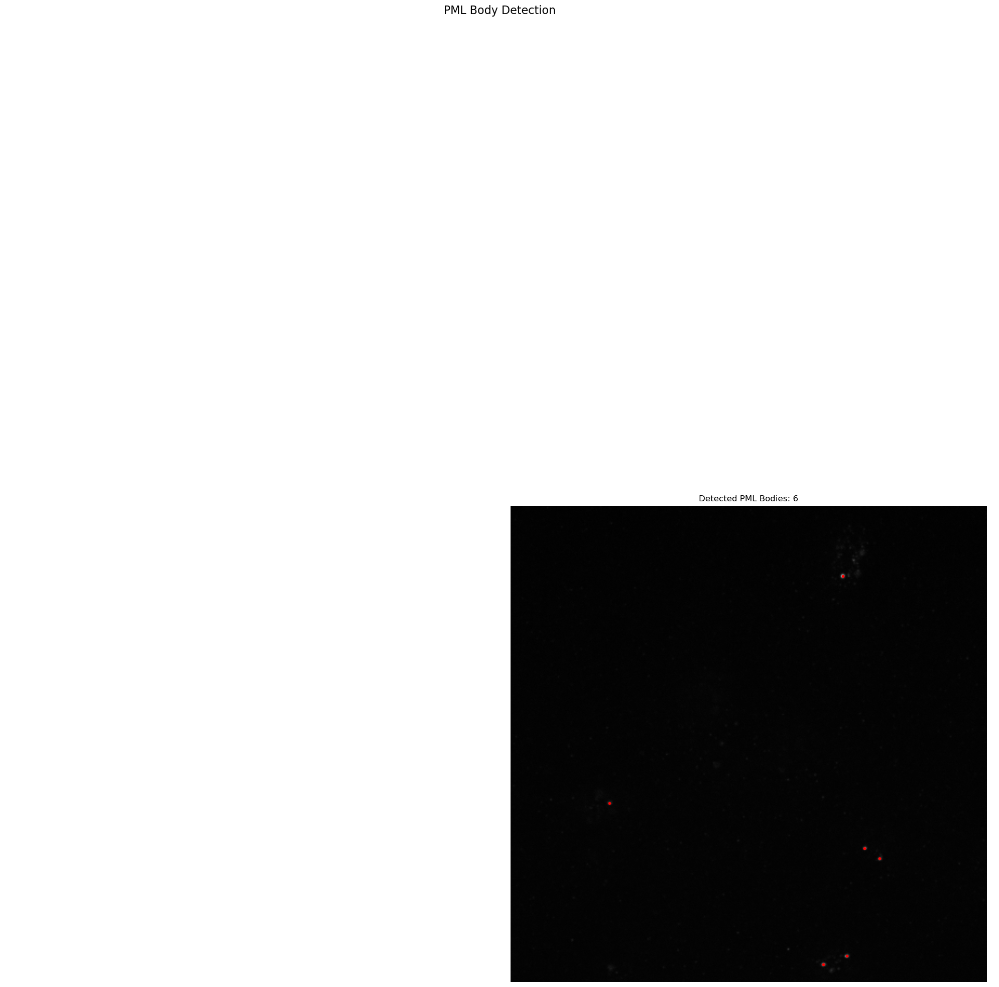

Number of potential PML bodies detected: 6
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z31_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z31_C1.tif


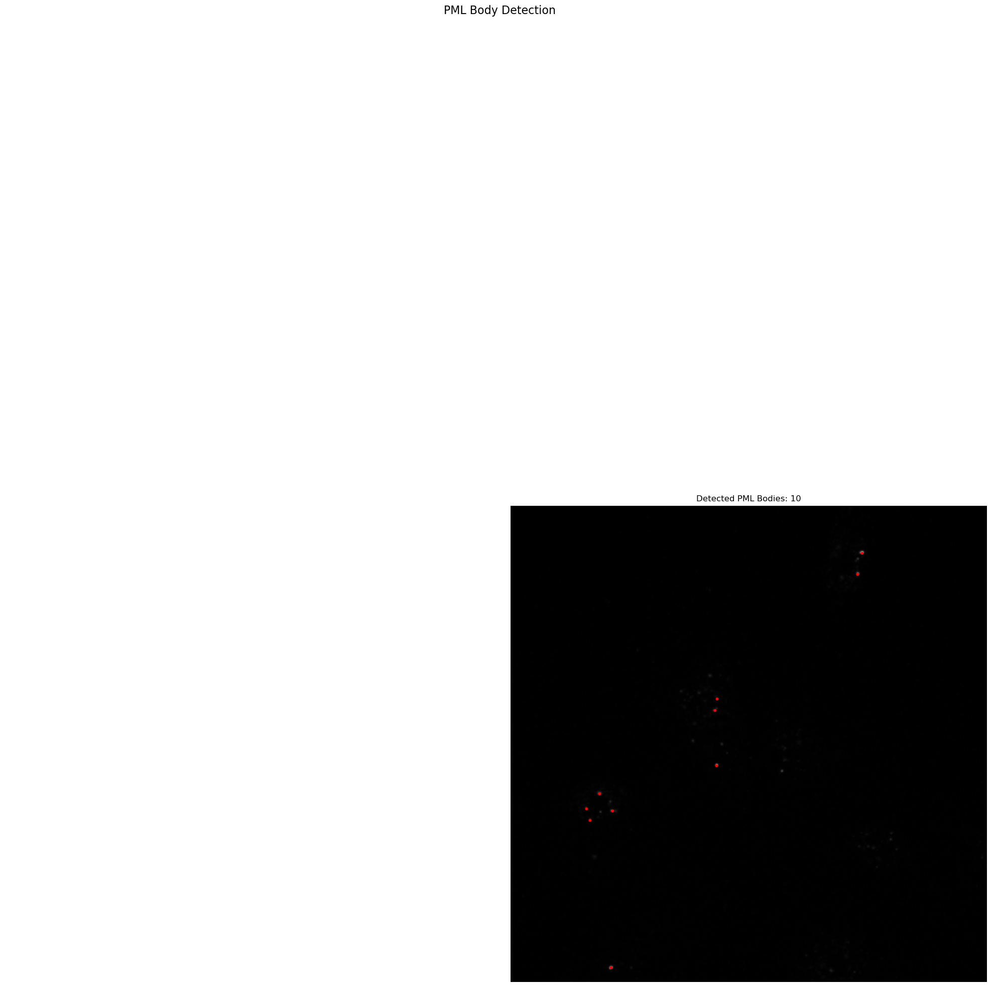

Number of potential PML bodies detected: 10
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z19_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z19_C1.tif


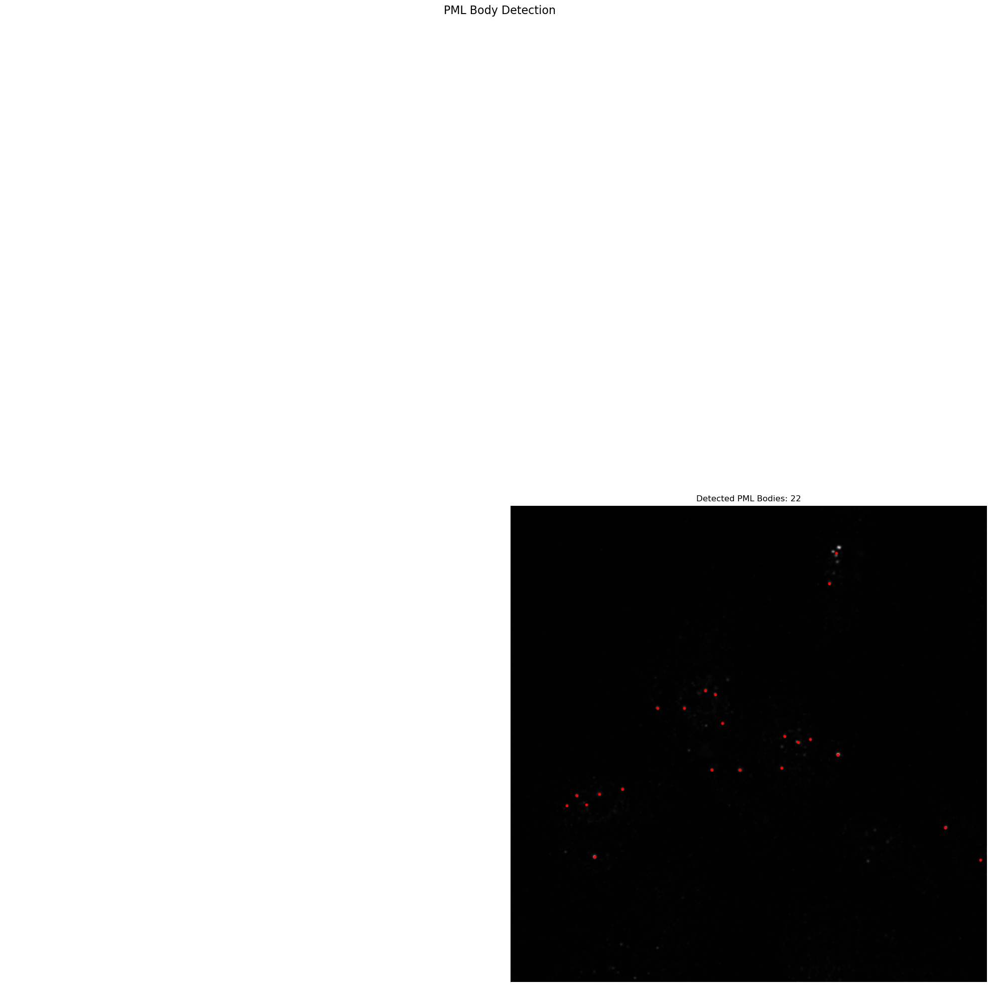

Number of potential PML bodies detected: 22
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z07_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z07_C1.tif


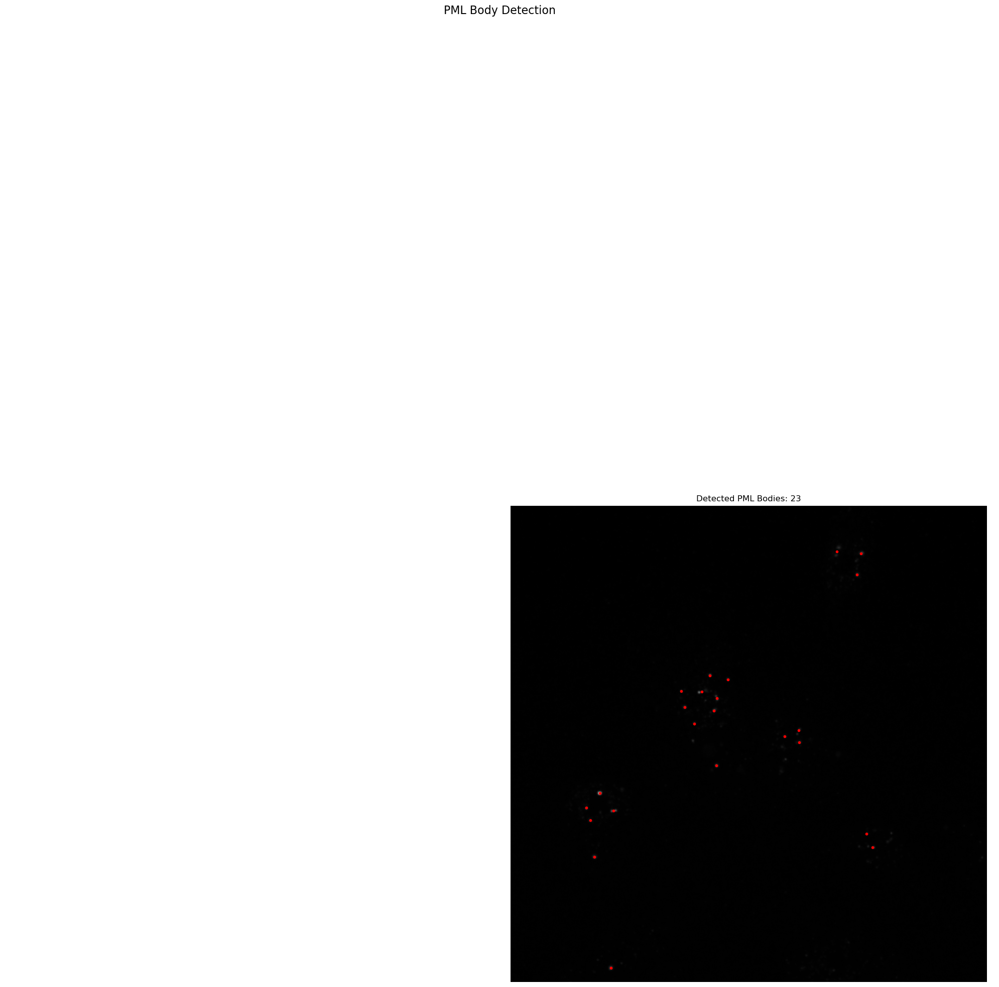

Number of potential PML bodies detected: 23
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z15_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z15_C1.tif


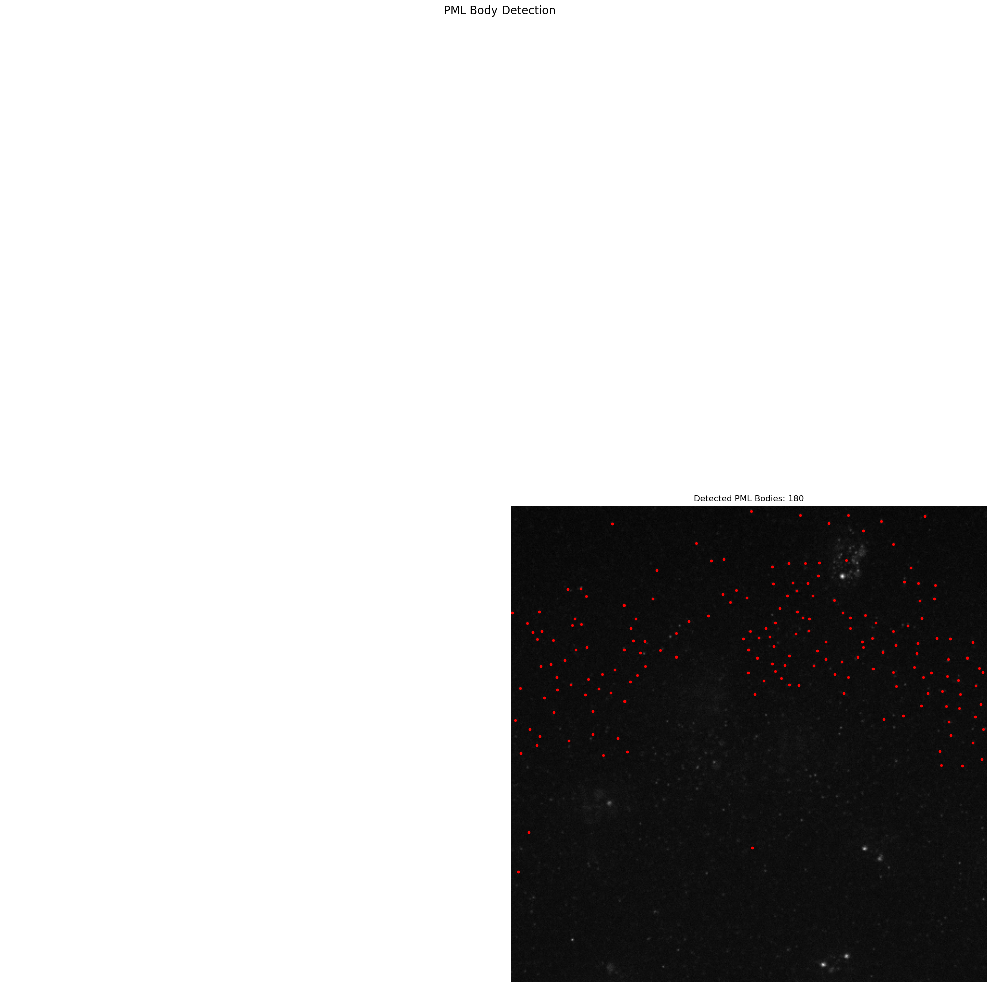

Number of potential PML bodies detected: 180
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z34_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z34_C1.tif


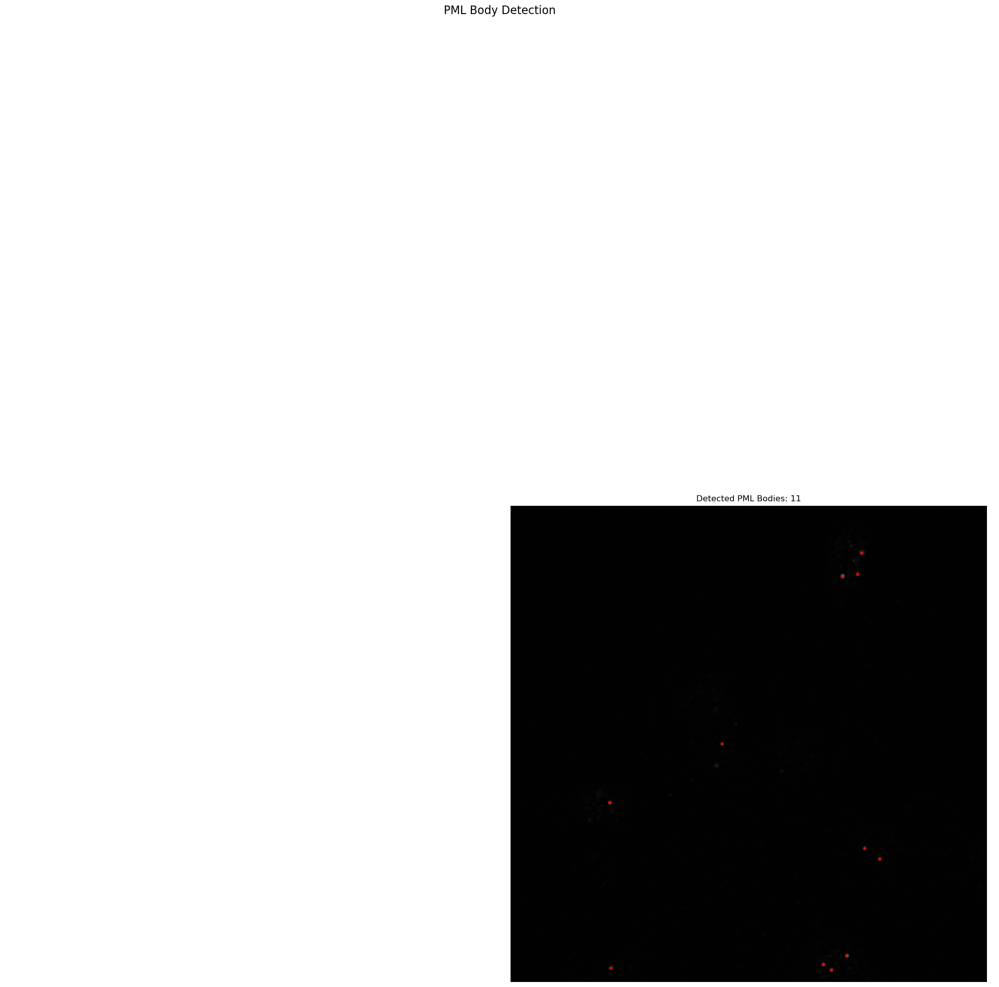

Number of potential PML bodies detected: 11
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z26_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z26_C1.tif


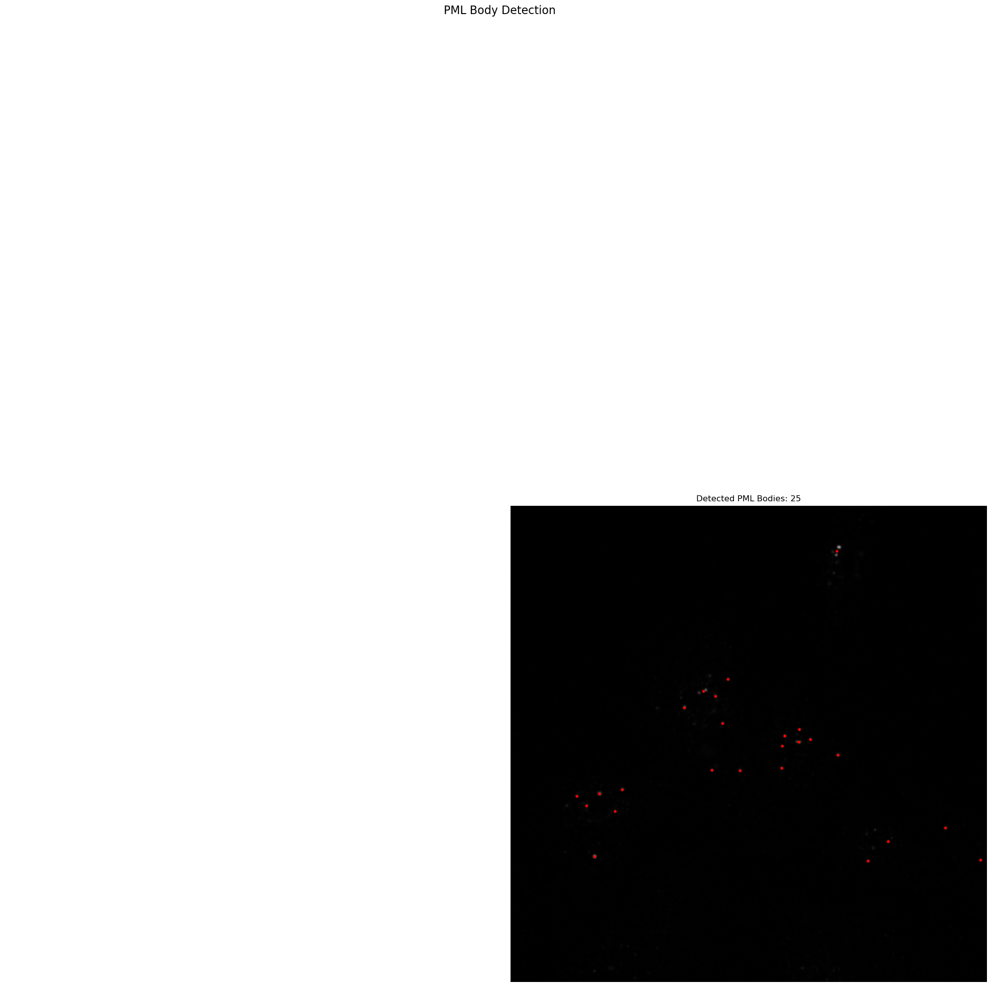

Number of potential PML bodies detected: 25
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z10_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z10_C1.tif


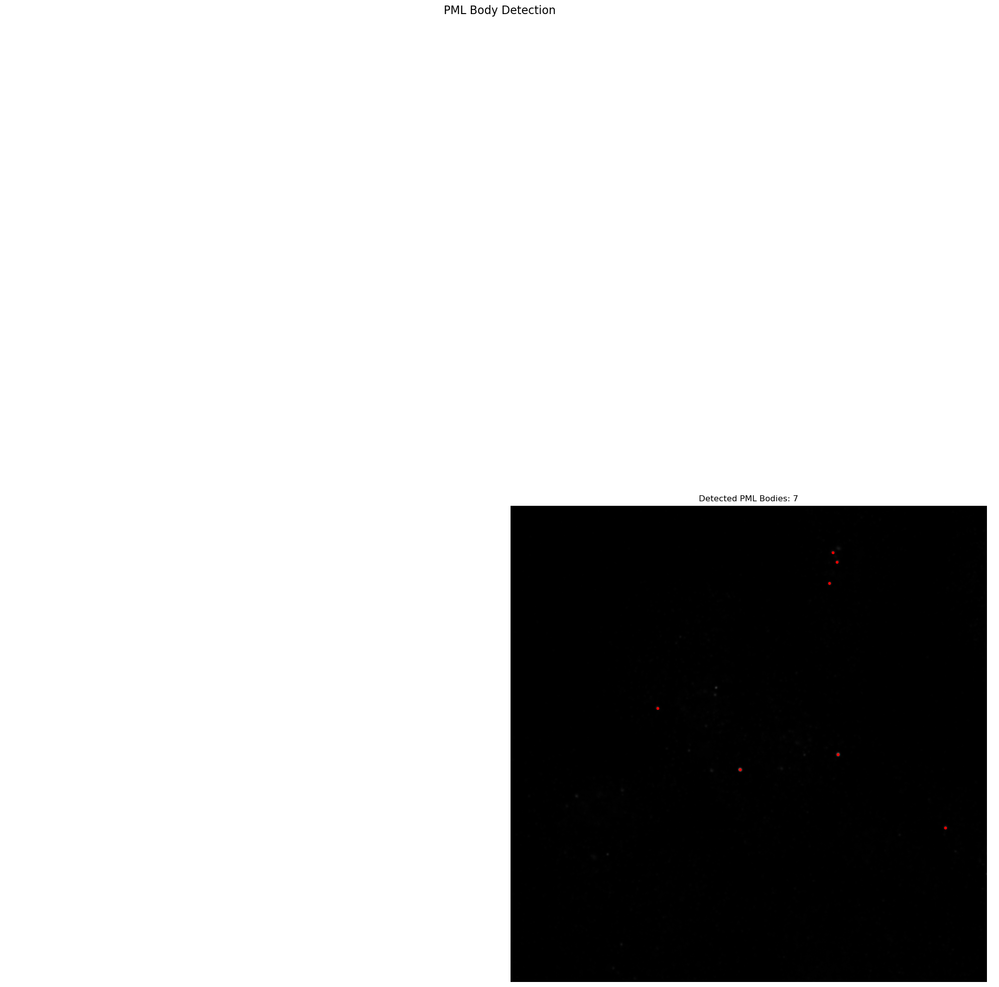

Number of potential PML bodies detected: 7
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z02_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z02_C1.tif


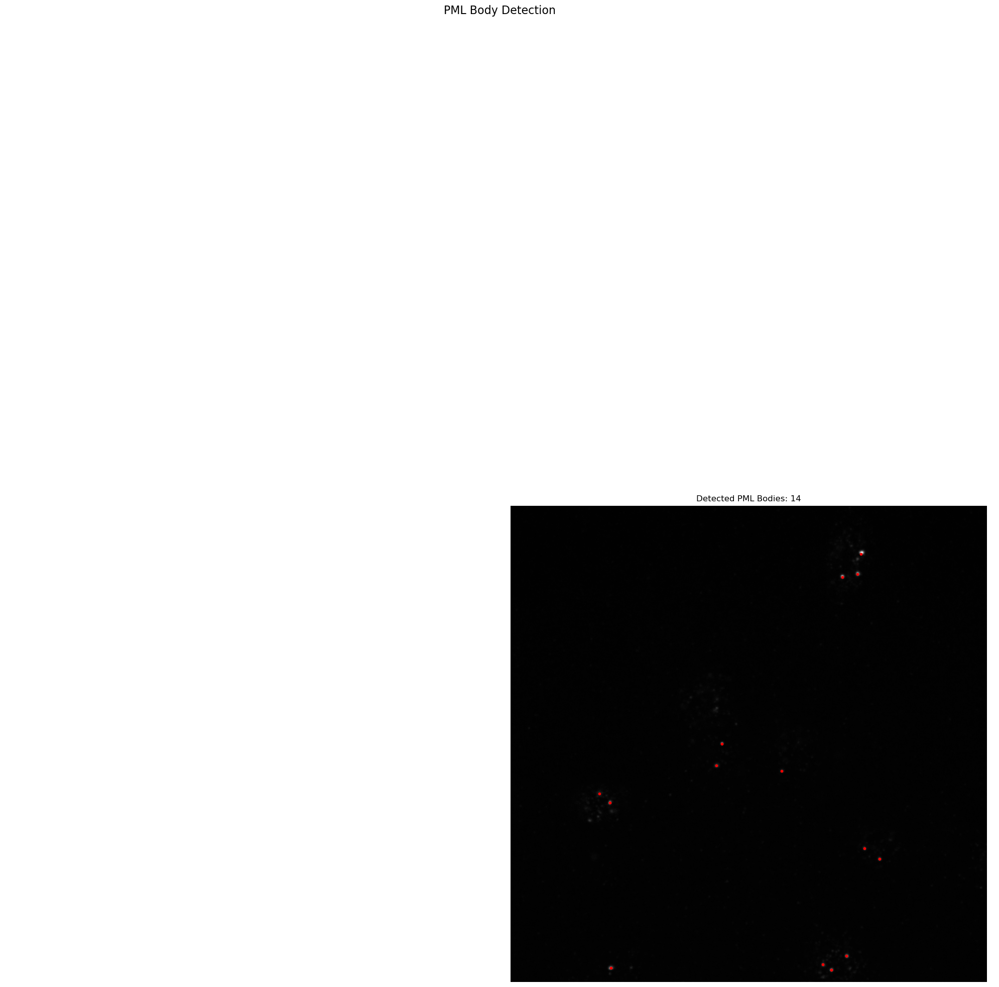

Number of potential PML bodies detected: 14
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z24_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z24_C1.tif


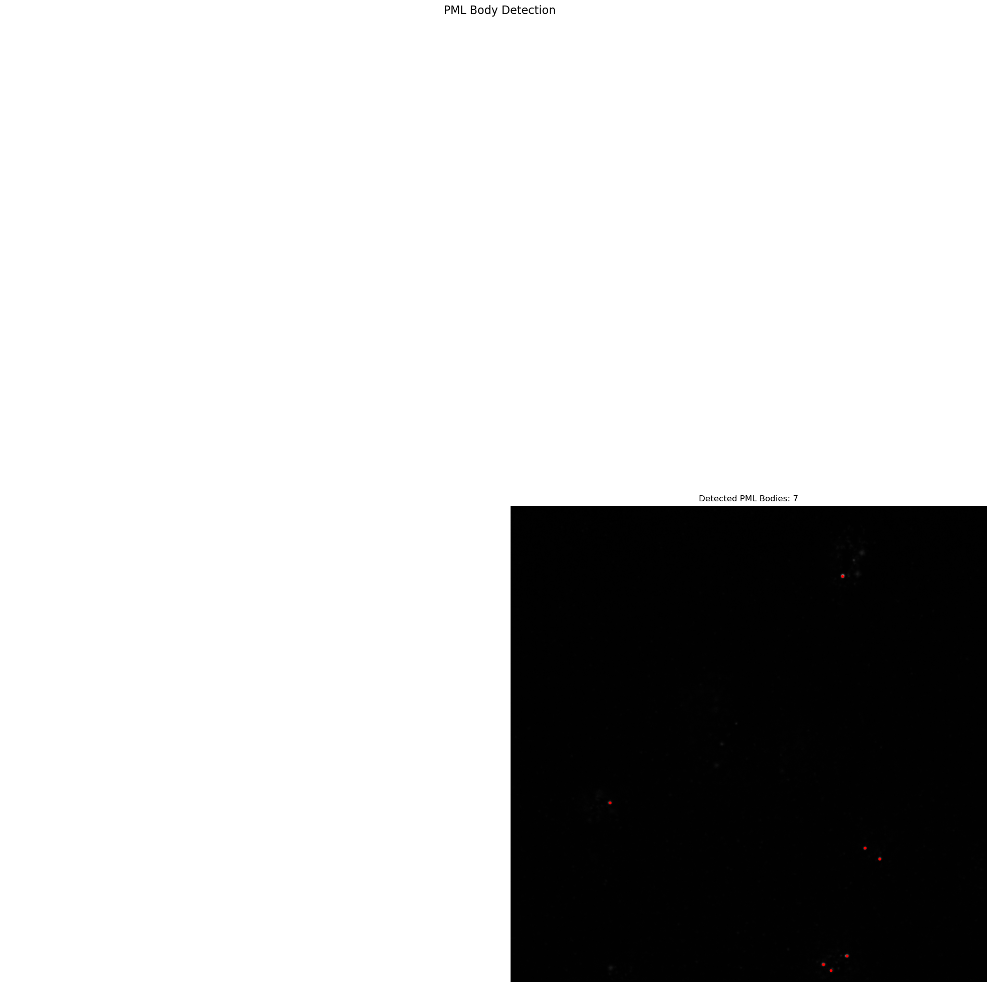

Number of potential PML bodies detected: 7
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z28_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z28_C1.tif


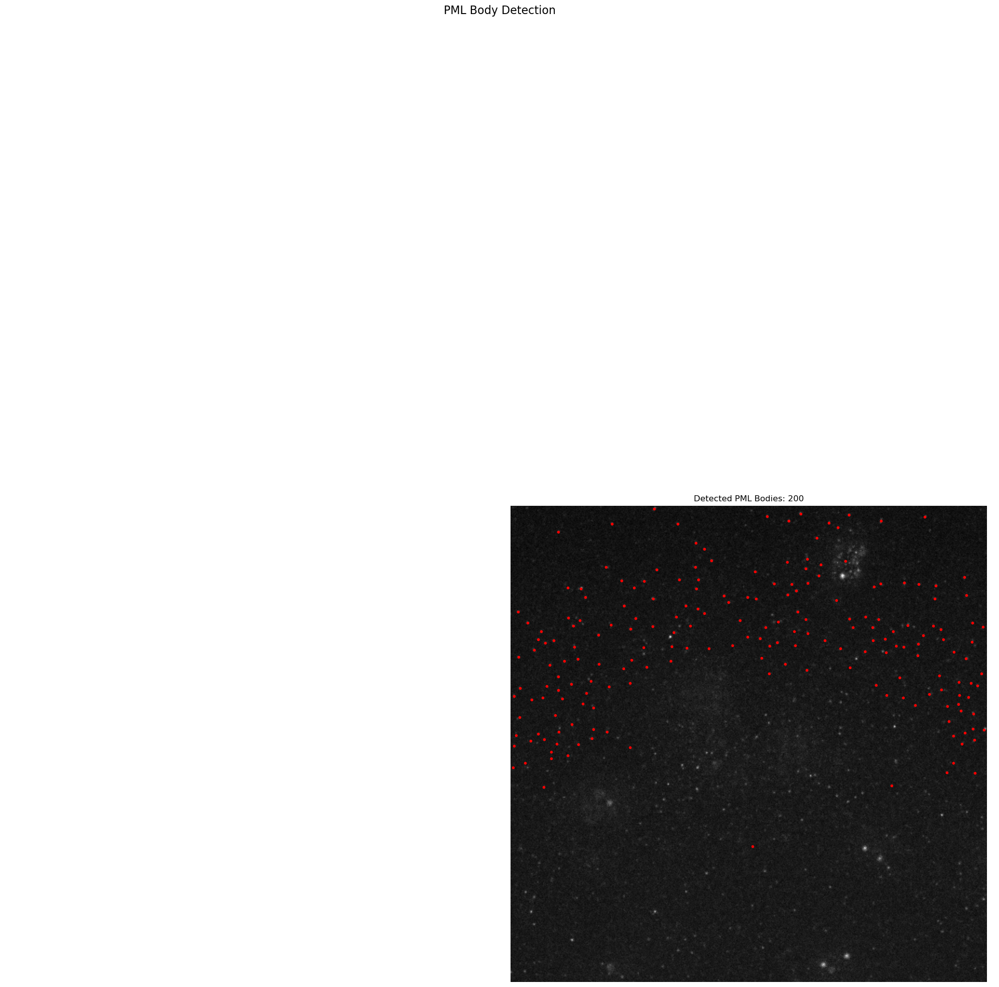

Number of potential PML bodies detected: 200
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z36_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z36_C1.tif


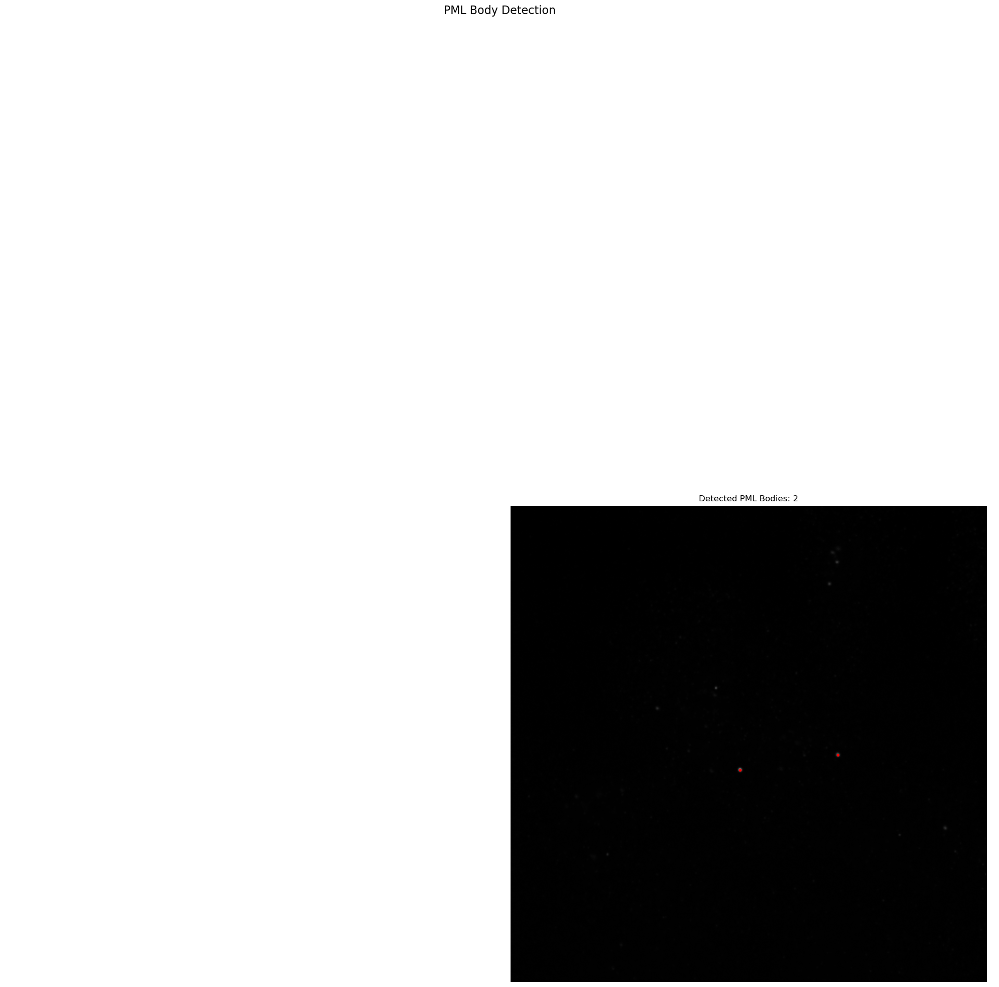

Number of potential PML bodies detected: 2
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z00_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z00_C1.tif


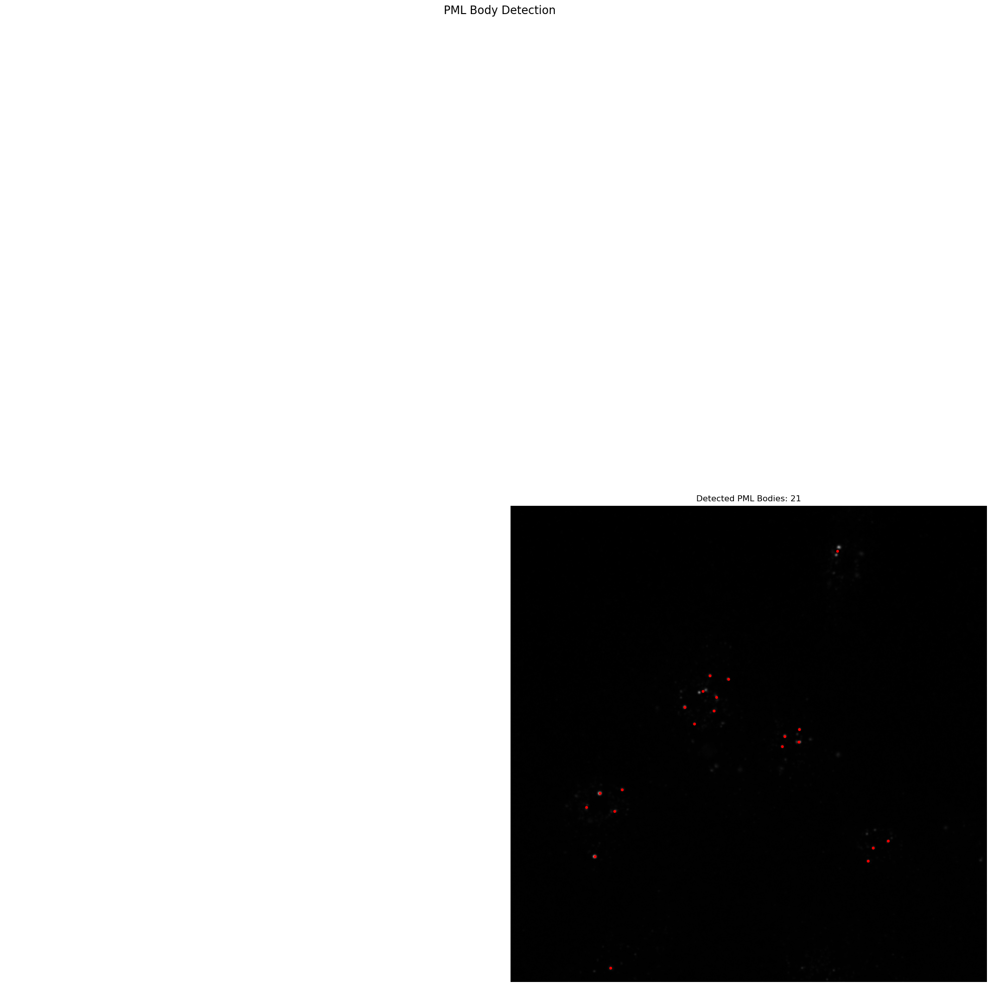

Number of potential PML bodies detected: 21
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z12_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z12_C1.tif


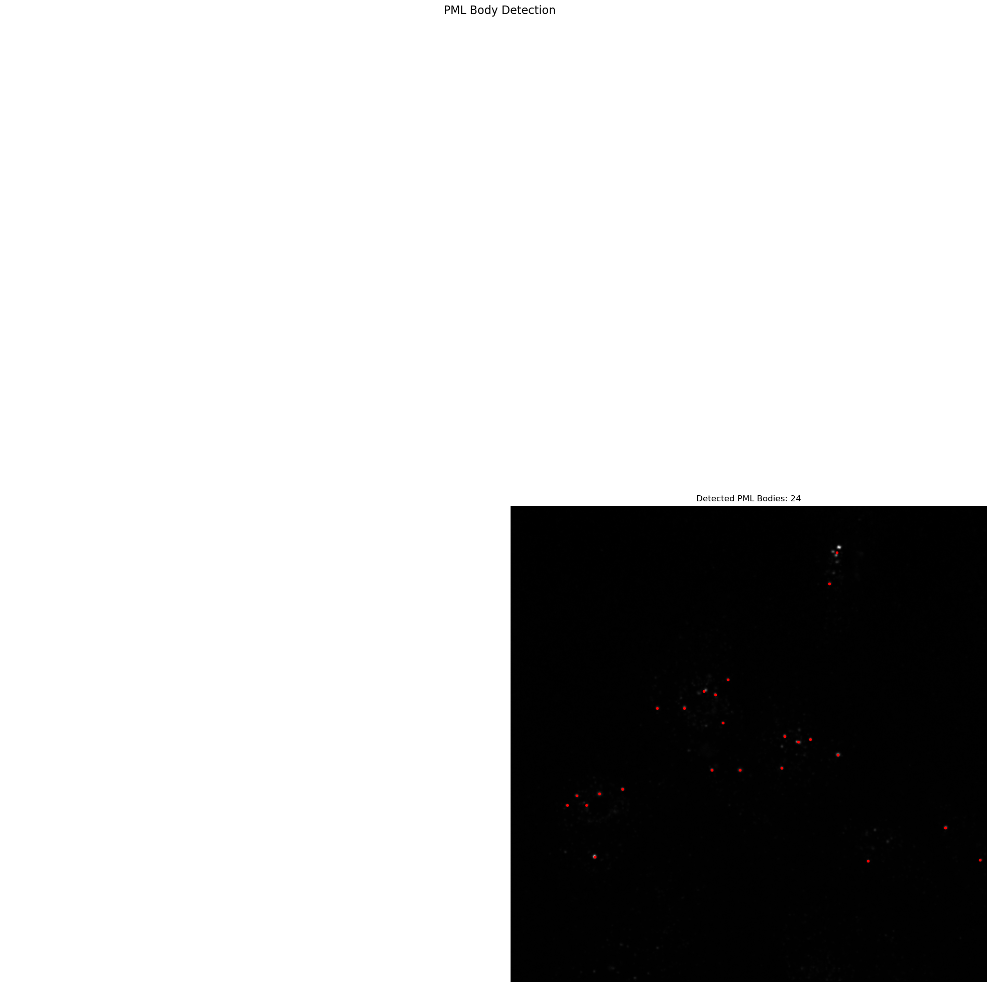

Number of potential PML bodies detected: 24
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z08_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z08_C1.tif


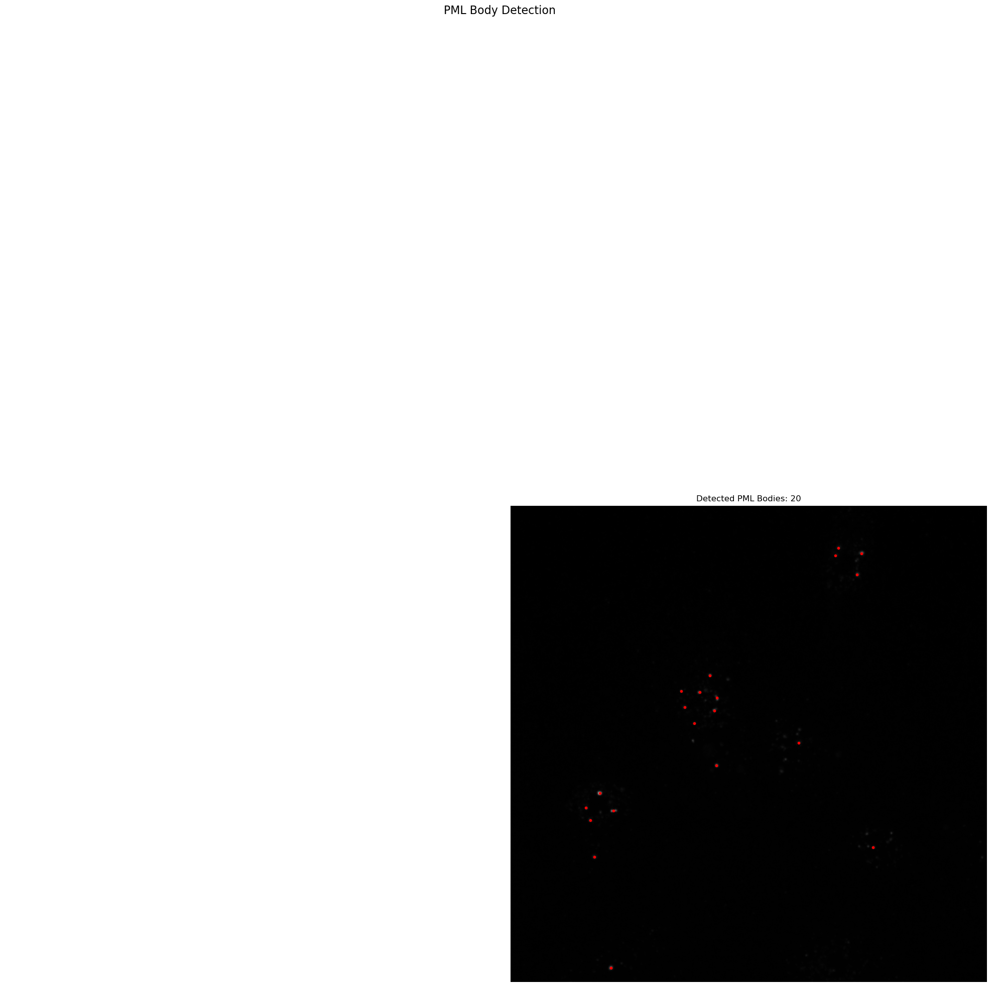

Number of potential PML bodies detected: 20
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z16_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z16_C1.tif


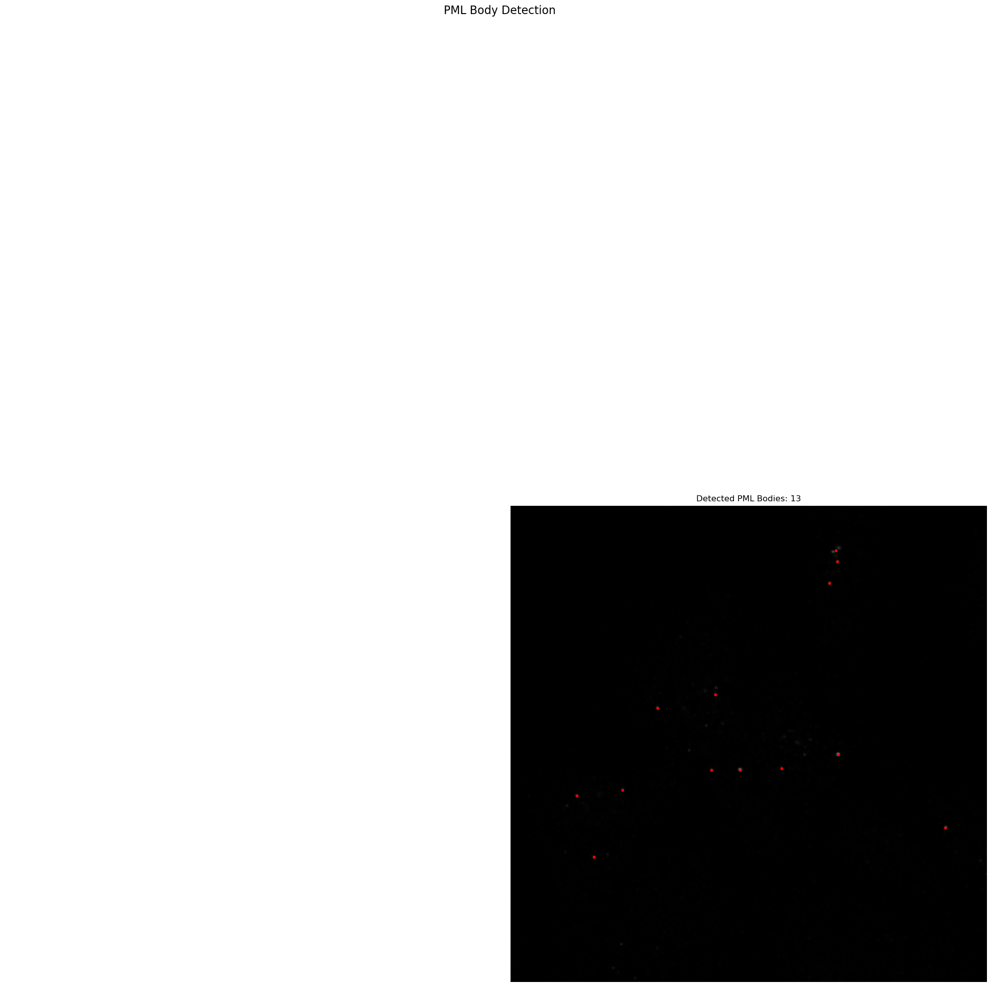

Number of potential PML bodies detected: 13
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z04_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z04_C1.tif


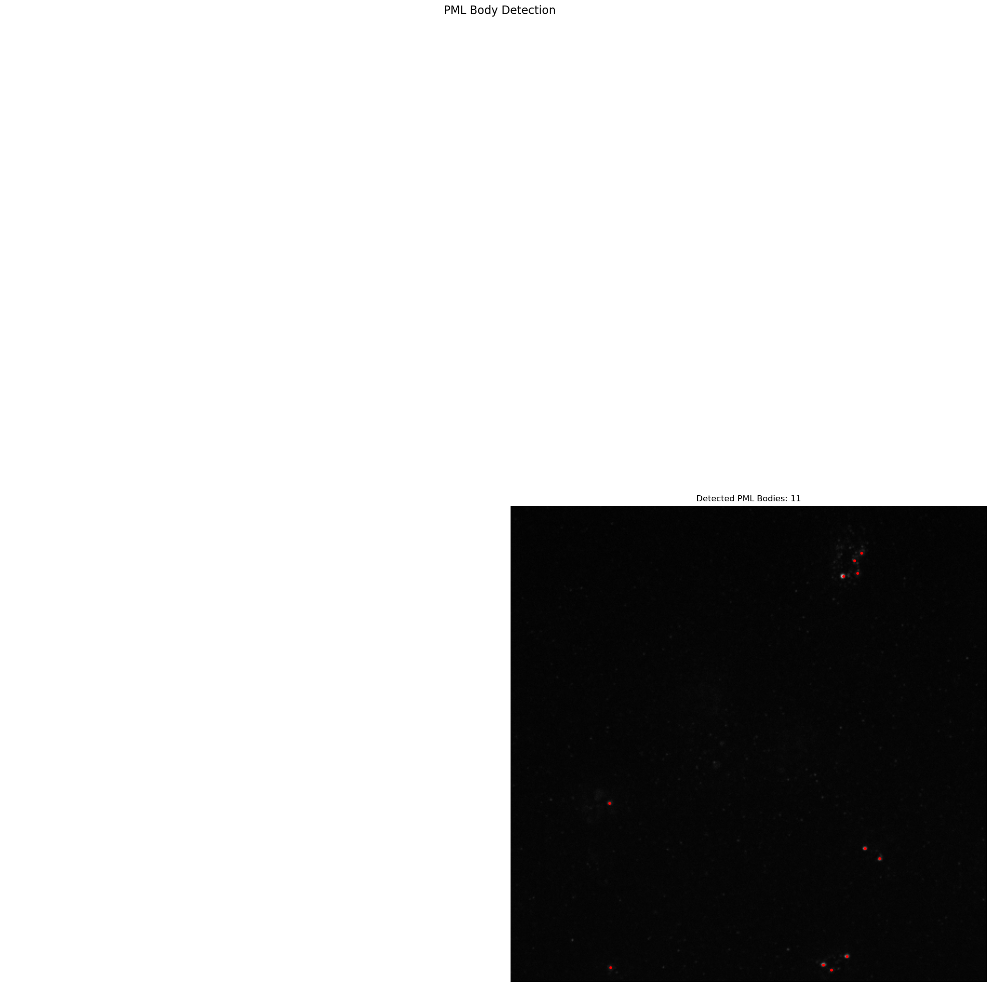

Number of potential PML bodies detected: 11
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z32_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z32_C1.tif


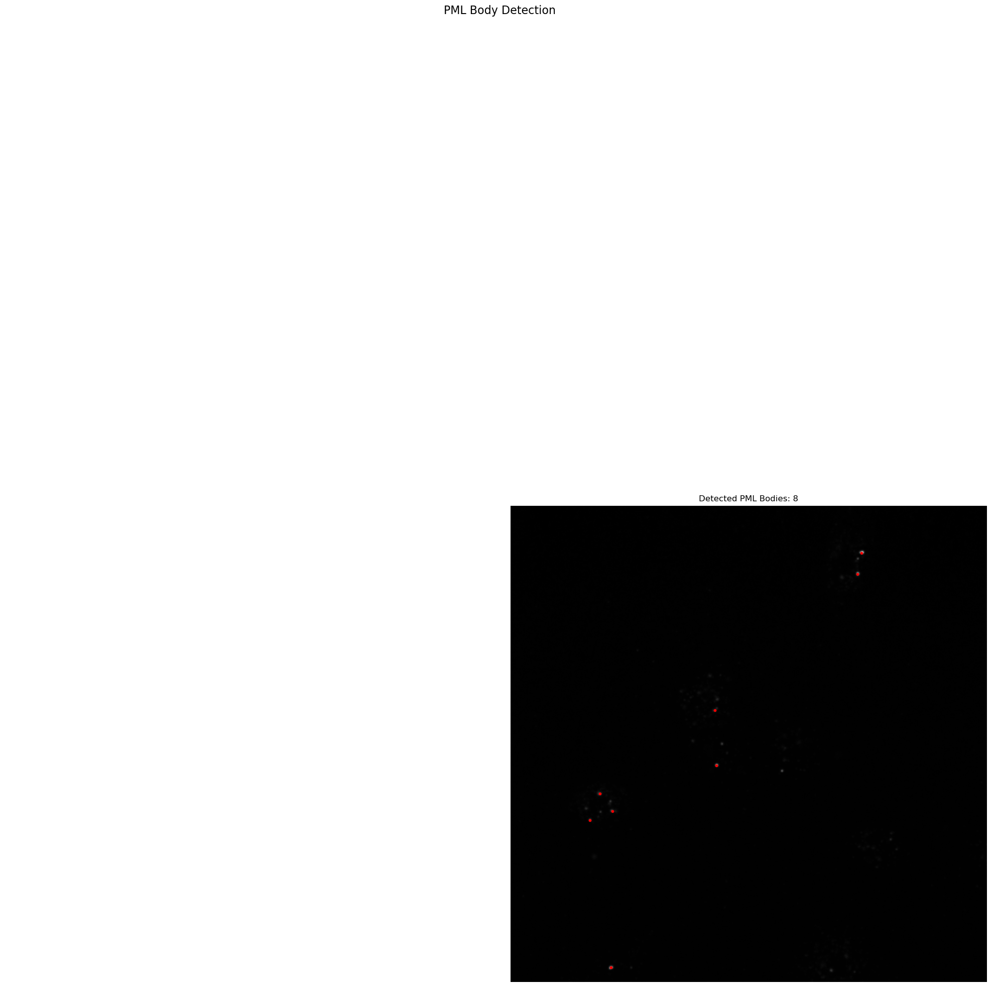

Number of potential PML bodies detected: 8
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z20_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z20_C1.tif


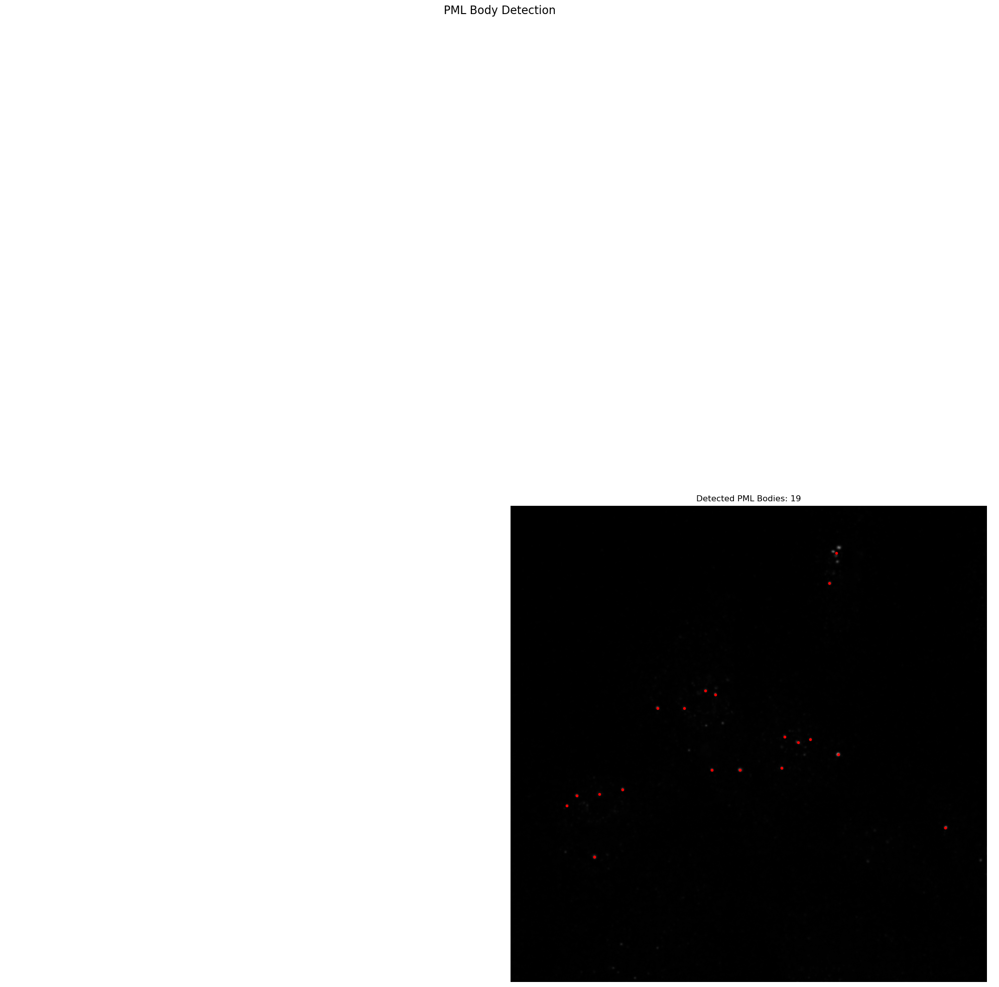

Number of potential PML bodies detected: 19
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z06_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z06_C1.tif


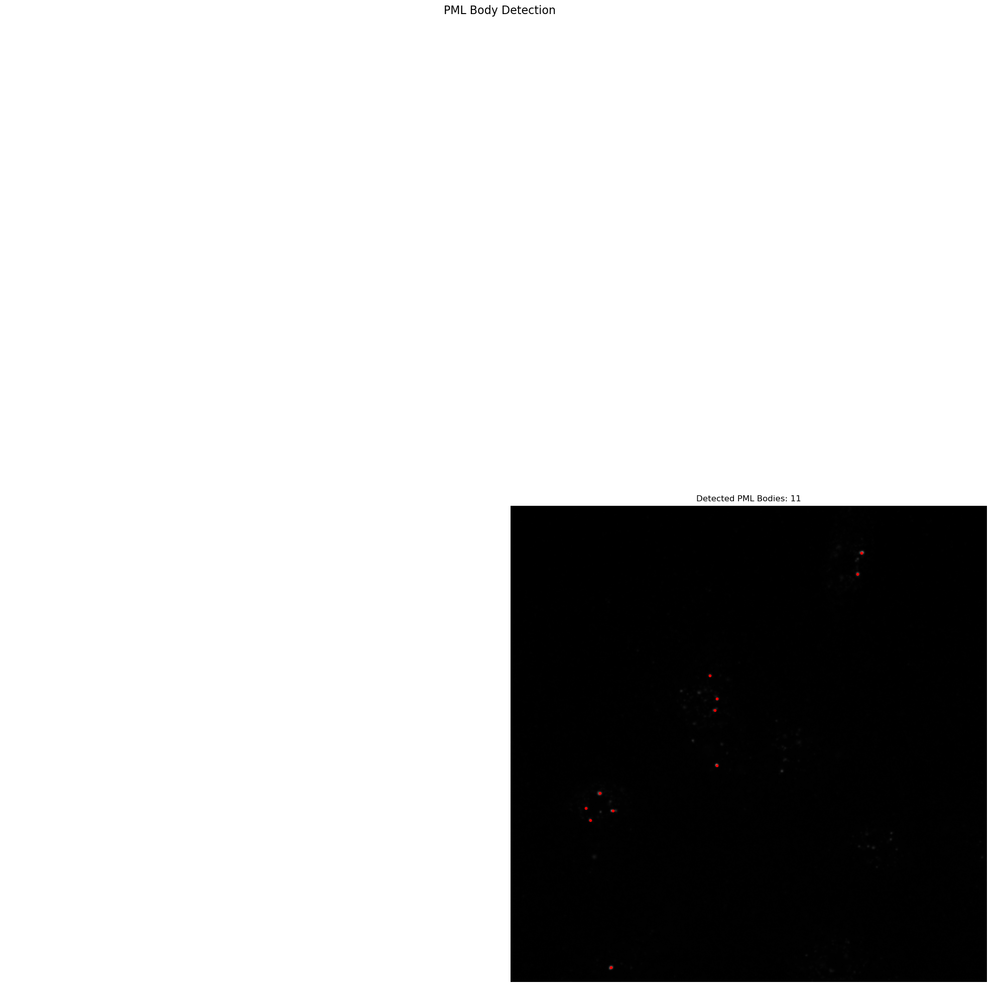

Number of potential PML bodies detected: 11
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z18_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z18_C1.tif


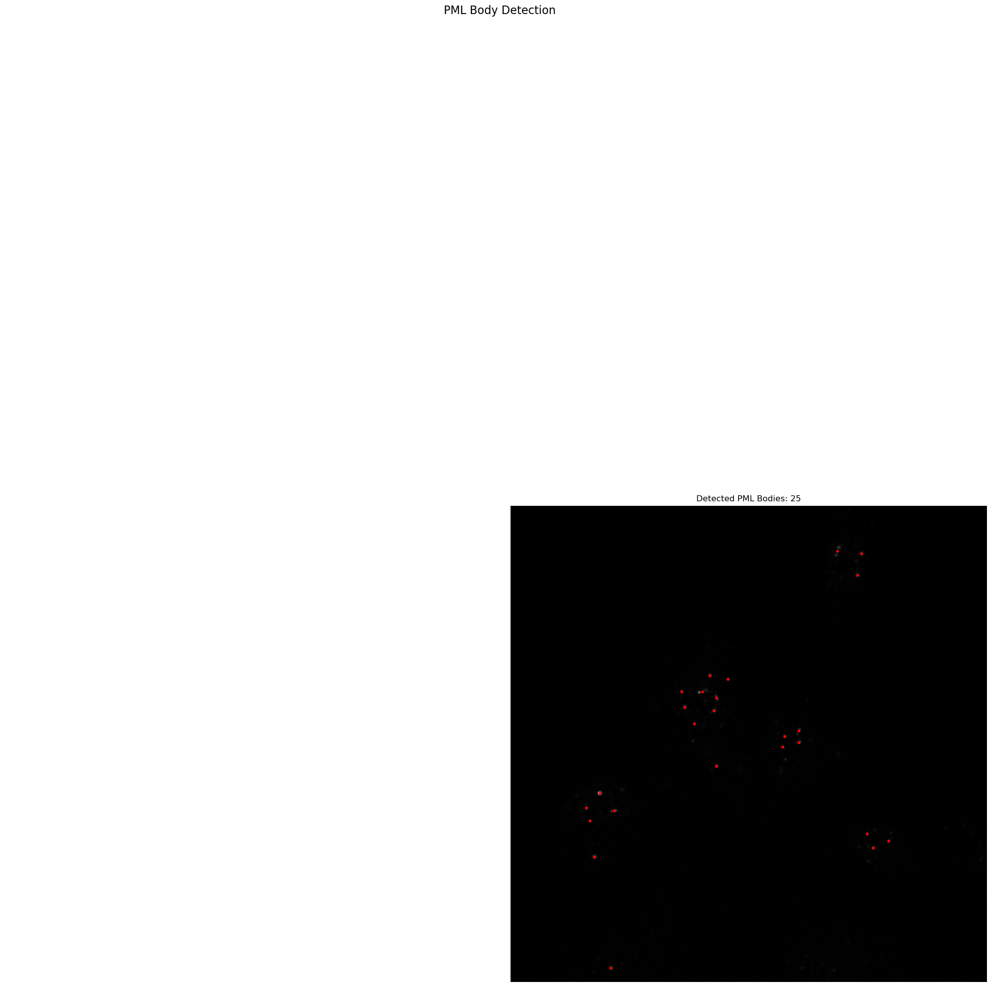

Number of potential PML bodies detected: 25
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z14_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z14_C1.tif


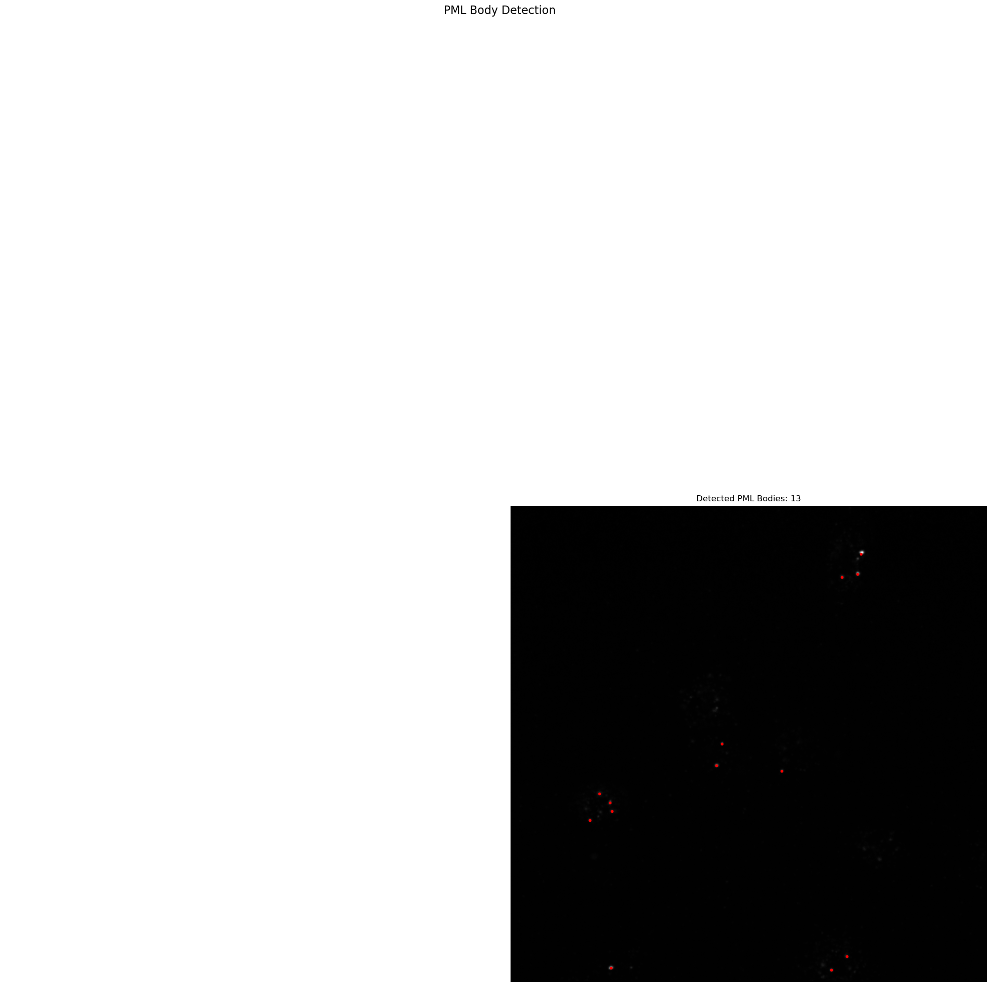

Number of potential PML bodies detected: 13
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z22_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z22_C1.tif


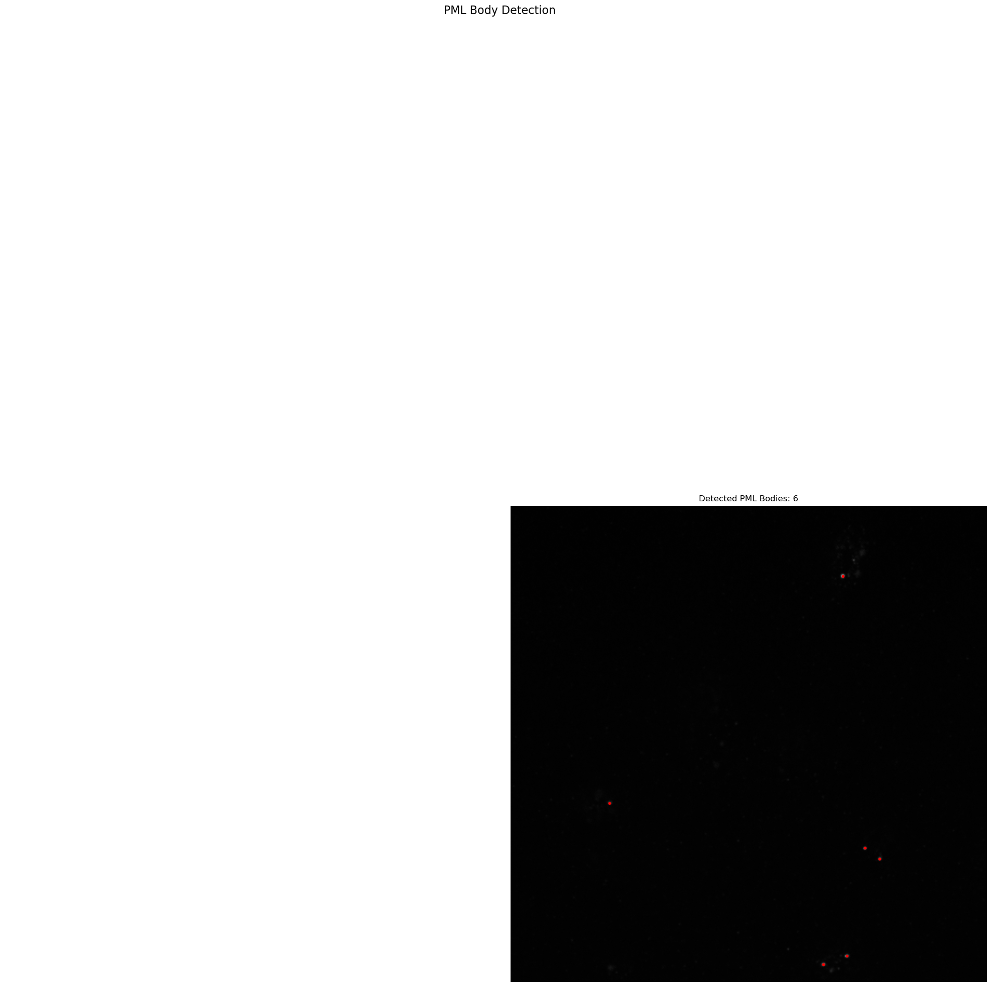

Number of potential PML bodies detected: 6
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z30_C1.tif
Saved processed image to /Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output/processed_SAEC exp1 As High 63x - Position 1_Z30_C1.tif


In [157]:
# Define the input folder path (where your images are located)
input_folder = '/Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/PMLBodies'  # Replace with the actual path to your input folder

# Define the output folder path (where you want the processed images to be saved)
output_folder = '/Users/pallavisingh/Library/CloudStorage/OneDrive-DalhousieUniversity/MLOPs Project/Output'  # Replace with the actual path to your output folder

# Call the function to process all images in the folder
process_images_in_folder_pml(input_folder, output_folder)